In [5]:
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

In [6]:
import keras
import pandas as pd
import tensorflow as tf

import numpy as np
# from keras.models import Sequential, Model
# from keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import np_utils

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D, Input,AveragePooling2D, BatchNormalization, LeakyReLU, SpatialDropout2D

# from keras.applications import MobileNet
# from keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2, InceptionV3
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import os
from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import KFold

from collections import defaultdict,Counter
from imblearn.over_sampling import SMOTE
from PIL import Image

from kerastuner import HyperModel

Using TensorFlow backend.


<h2>Data Loading and Preparation</h2>

In [7]:
def getSpeciesCode(x):
    part = x.split('_')
    if part[0] == 'ASETRI':
        return 0
    elif part[0] == 'EPTBOT':
        return 1
    elif part[0] == 'MYOEMA':
        return 2
    elif part[0] == 'PIPKUH':
        return 3
    elif part[0] == 'RHIMUS':
        return 4
    elif part[0] == 'RHYNAS':
        return 5
    elif part[0] == 'ROUAEG':
        return 6
    elif part[0] == 'TAPPER':
        return 7
    else:
        return 'Unknown'
    
def getSpecies(x):
    if x == 0:
        return 'A.tridens'
    elif x == 1:
        return 'E.bottae'
    elif x == 2:
        return 'M.emarginatus'
    elif x == 3:
        return 'P.kuhli'
    elif x == 4:
        return 'R.muscatellum'
    elif x == 5:
        return 'R.nasutus'
    elif x == 6:
        return 'R.aegyptius'
    elif x == 7:
        return 'T.perforatus'
    else:
        return 'Unknown'
    
    
def generate_actual_predicted(Y_pred, X_test, Y_test): 
    predicted = list()
    for i in range(len(Y_pred)):
        predicted.append(np.argmax(Y_pred[i]))
        
    actual = list()
    for i in range(len(Y_test)):
        actual.append(np.argmax(Y_test[i]))
        
    return actual, predicted



# Ytrain in Onehot encoded form 
def makeOverSamplesSMOTE(X_train,Y_train):
    
    Y_train_labelled=[]
    X_dims=X_train.shape

    for i in range(len(Y_train)):
        Y_train_labelled.append(np.argmax(Y_train[i]))

    print('Original trainingset shape %s' %  [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])       
    X_train= X_train.reshape(-1,X_dims[1]*X_dims[2]*X_dims[3])

    sm = SMOTE(sampling_strategy='all',k_neighbors=5)
    X_train, Y_train_labelled = sm.fit_resample(X_train, Y_train_labelled)


    print('Resampled training set shape %s' % [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])


    #reshape X_all
    X_train= X_train.reshape(-1,X_dims[1],X_dims[2],X_dims[3])

    # update Y_train
    Y_train= np_utils.to_categorical(Y_train_labelled, num_classes=8)

    print("After OverSampling\nX_train: shape= ",X_train.shape)
    print("Y_train: shape= ",Y_train.shape)

    
    
    return(X_train,Y_train)

In [8]:
image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]
species = []
for file_name in file_paths:
    sp = file_name.split('_')
    species.append(sp[0])

df = pd.DataFrame(species, columns=['Species'])
df['Species'].value_counts()

RHIMUS    1665
TAPPER     403
PIPKUH     299
RHYNAS     269
EPTBOT     124
ROUAEG     121
MYOEMA     112
ASETRI      25
Name: Species, dtype: int64

In [9]:
X_all = []
Y_all = []

image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((170, 112))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [10]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 112, 170, 3)
(3018,)


In [11]:
# train /test= 80/20% split
# Data is stratified
X_train, X_test, Y_train, Y_test = train_test_split(X_all, Y_all, test_size=0.2, random_state = 245, stratify=Y_all)


<h2> V1 !!!!! K-Fold Training and Evaluation</h2>

In [8]:
folder = "models"
mode_version = "spec_smote_v1"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v1


In [9]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=16,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=64,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [10]:
model = build_current_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 16)        2368      
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 16)        64        
_________________________________________________________________
activation (Activation)      (None, 56, 85, 16)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 16)        0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 22, 64)        25664 

In [11]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 6s - loss: 1.8076 - accuracy: 0.3112 - val_loss: 1.8829 - val_accuracy: 0.1710
Epoch 2/100
1199/1199 - 6s - loss: 1.4218 - accuracy: 0.4734 - val_loss: 1.4039 - val_accuracy: 0.4835
Epoch 3/100
1199/1199 - 5s - loss: 1.0279 - accuracy: 0.6418 - val_loss: 1.8722 - val_accuracy: 0.3217
Epoch 4/100
1199/1199 - 5s - loss: 0.7809 - accuracy: 0.7326 - val_loss: 0.8627 - val_accuracy: 0.6544
Epoch 5/100
1199/1199 - 6s - loss: 0.6275 - accuracy: 0.7883 - val_loss: 0.6424 - val_accuracy: 0.8051

Epoch 28/100
1199/1199 - 6s - loss: 0.1539 - accuracy: 0.9504 - val_loss: 0.3239 - val_accuracy: 0.9062
Epoch 29/100
1199/1199 - 6s - loss: 0.1444 - accuracy: 0.9564 - val_loss: 0.3864 - val_accuracy: 0.8658
Epoch 30/100
1199/1199 - 5s - loss: 0.1427 - accuracy: 0.9585 - val_loss: 0.2974 - val_accuracy: 0.9173
Epoch 31/100
1199/1199 - 6s - loss: 0.1374 - accuracy: 0.9583 - val_loss: 0.3831 - val_accuracy: 0.9062
Epoch 32/100
1199/1199 - 4s - loss: 0.1327 - accuracy: 0.9589 - val_loss: 0.2863 - val_accuracy: 0.9228
Epoch 33/100
1199/1199 - 5s - loss: 0.1309 - accuracy: 0.9586 - val_loss: 0.3221 - val_accuracy: 0.9007
Epoch 34/100
1199/1199 - 6s - loss: 0.1309 - accuracy: 0.9583 - val_loss: 0.3377 - val_accuracy: 0.9191
Epoch 35/100
1199/1199 - 5s - loss: 0.1252 - accuracy: 0.9639 - val_loss: 0.3026 - val_accuracy: 0.9136
Epoch 36/100
1199/1199 - 4s - loss: 0.1242 - accuracy: 0.9618 - val_loss: 0.3393 - val_accuracy: 0.9026
Epoch 37/100
1199/1199 - 5s - loss: 0.1246 - accuracy: 0.9621 - 

Epoch 34/100
1198/1198 - 6s - loss: 0.1540 - accuracy: 0.9528 - val_loss: 0.3013 - val_accuracy: 0.9044
Epoch 35/100
1198/1198 - 5s - loss: 0.1402 - accuracy: 0.9559 - val_loss: 0.3008 - val_accuracy: 0.9191
Epoch 36/100
1198/1198 - 5s - loss: 0.1355 - accuracy: 0.9575 - val_loss: 0.2614 - val_accuracy: 0.9228
Epoch 37/100
1198/1198 - 6s - loss: 0.1391 - accuracy: 0.9568 - val_loss: 0.2654 - val_accuracy: 0.9265
Epoch 38/100
1198/1198 - 5s - loss: 0.1285 - accuracy: 0.9605 - val_loss: 0.3449 - val_accuracy: 0.9062
Epoch 39/100
1198/1198 - 6s - loss: 0.1410 - accuracy: 0.9592 - val_loss: 0.3017 - val_accuracy: 0.9154
Epoch 40/100
1198/1198 - 5s - loss: 0.1152 - accuracy: 0.9662 - val_loss: 0.3617 - val_accuracy: 0.9154
Epoch 41/100
1198/1198 - 6s - loss: 0.1249 - accuracy: 0.9635 - val_loss: 0.2457 - val_accuracy: 0.9320
Epoch 42/100
1198/1198 - 5s - loss: 0.1253 - accuracy: 0.9625 - val_loss: 0.2883 - val_accuracy: 0.9191
Epoch 43/100
1198/1198 - 6s - loss: 0.1147 - accuracy: 0.9644 - 

Epoch 43/100
1198/1198 - 5s - loss: 0.1269 - accuracy: 0.9586 - val_loss: 0.4219 - val_accuracy: 0.8879
Epoch 44/100
1198/1198 - 6s - loss: 0.1011 - accuracy: 0.9691 - val_loss: 0.1996 - val_accuracy: 0.9449
Epoch 45/100
1198/1198 - 6s - loss: 0.1130 - accuracy: 0.9643 - val_loss: 0.2037 - val_accuracy: 0.9430
Epoch 46/100
1198/1198 - 5s - loss: 0.1198 - accuracy: 0.9642 - val_loss: 0.2963 - val_accuracy: 0.9136
Epoch 47/100
1198/1198 - 5s - loss: 0.1152 - accuracy: 0.9631 - val_loss: 0.1945 - val_accuracy: 0.9430
Epoch 48/100
1198/1198 - 5s - loss: 0.1024 - accuracy: 0.9658 - val_loss: 0.2907 - val_accuracy: 0.9173
Epoch 49/100
1198/1198 - 4s - loss: 0.1024 - accuracy: 0.9680 - val_loss: 0.2715 - val_accuracy: 0.9246
Epoch 50/100
1198/1198 - 5s - loss: 0.1004 - accuracy: 0.9716 - val_loss: 0.3012 - val_accuracy: 0.9154
Epoch 51/100
1198/1198 - 6s - loss: 0.1074 - accuracy: 0.9690 - val_loss: 0.2654 - val_accuracy: 0.9228
Epoch 52/100
1198/1198 - 6s - loss: 0.0989 - accuracy: 0.9715 - 

1198/1198 - 6s - loss: 0.2724 - accuracy: 0.9103 - val_loss: 0.4605 - val_accuracy: 0.8511
Epoch 17/100
1198/1198 - 7s - loss: 0.2552 - accuracy: 0.9181 - val_loss: 0.2892 - val_accuracy: 0.9026
Epoch 18/100
1198/1198 - 6s - loss: 0.2391 - accuracy: 0.9244 - val_loss: 0.2204 - val_accuracy: 0.9283
Epoch 19/100
1198/1198 - 6s - loss: 0.2284 - accuracy: 0.9284 - val_loss: 0.2448 - val_accuracy: 0.9173
Epoch 20/100
1198/1198 - 5s - loss: 0.2141 - accuracy: 0.9345 - val_loss: 0.2956 - val_accuracy: 0.8897
Epoch 21/100
1198/1198 - 6s - loss: 0.2066 - accuracy: 0.9332 - val_loss: 0.4635 - val_accuracy: 0.8676
Epoch 22/100
1198/1198 - 5s - loss: 0.1972 - accuracy: 0.9380 - val_loss: 0.2274 - val_accuracy: 0.9301
Epoch 23/100
1198/1198 - 6s - loss: 0.1992 - accuracy: 0.9370 - val_loss: 0.4964 - val_accuracy: 0.8217
Epoch 24/100
1198/1198 - 6s - loss: 0.2033 - accuracy: 0.9381 - val_loss: 0.2028 - val_accuracy: 0.9283
Epoch 25/100
1198/1198 - 5s - loss: 0.1731 - accuracy: 0.9450 - val_loss: 0.2

Epoch 37/100
1199/1199 - 6s - loss: 0.1319 - accuracy: 0.9599 - val_loss: 0.2214 - val_accuracy: 0.9393
Epoch 38/100
1199/1199 - 6s - loss: 0.1055 - accuracy: 0.9676 - val_loss: 0.2523 - val_accuracy: 0.9393
Epoch 39/100
1199/1199 - 6s - loss: 0.1168 - accuracy: 0.9658 - val_loss: 0.2484 - val_accuracy: 0.9210
Epoch 40/100
1199/1199 - 5s - loss: 0.1019 - accuracy: 0.9701 - val_loss: 0.2189 - val_accuracy: 0.9375
Epoch 41/100
1199/1199 - 5s - loss: 0.1000 - accuracy: 0.9701 - val_loss: 0.2774 - val_accuracy: 0.9246
Epoch 42/100
1199/1199 - 6s - loss: 0.1023 - accuracy: 0.9690 - val_loss: 0.2302 - val_accuracy: 0.9467
Epoch 43/100
1199/1199 - 6s - loss: 0.0988 - accuracy: 0.9716 - val_loss: 0.2509 - val_accuracy: 0.9265
Epoch 44/100
1199/1199 - 6s - loss: 0.0975 - accuracy: 0.9702 - val_loss: 0.2512 - val_accuracy: 0.9449
Epoch 45/100
1199/1199 - 5s - loss: 0.1100 - accuracy: 0.9678 - val_loss: 0.2297 - val_accuracy: 0.9301
Epoch 46/100
1199/1199 - 5s - loss: 0.0864 - accuracy: 0.9736 - 

Epoch 44/100
1199/1199 - 6s - loss: 0.1024 - accuracy: 0.9681 - val_loss: 0.3816 - val_accuracy: 0.8952
Epoch 45/100
1199/1199 - 5s - loss: 0.1038 - accuracy: 0.9685 - val_loss: 0.3130 - val_accuracy: 0.9026
Epoch 46/100
1199/1199 - 6s - loss: 0.0930 - accuracy: 0.9725 - val_loss: 0.2150 - val_accuracy: 0.9393
Epoch 47/100
1199/1199 - 5s - loss: 0.0968 - accuracy: 0.9713 - val_loss: 0.2829 - val_accuracy: 0.9062
Epoch 48/100
1199/1199 - 5s - loss: 0.1082 - accuracy: 0.9681 - val_loss: 0.2254 - val_accuracy: 0.9375
Epoch 49/100
1199/1199 - 7s - loss: 0.0928 - accuracy: 0.9733 - val_loss: 0.1997 - val_accuracy: 0.9430
Epoch 50/100
1199/1199 - 6s - loss: 0.0991 - accuracy: 0.9680 - val_loss: 0.2899 - val_accuracy: 0.9154
Epoch 51/100
1199/1199 - 5s - loss: 0.0949 - accuracy: 0.9723 - val_loss: 0.3728 - val_accuracy: 0.9099
Epoch 52/100
1199/1199 - 5s - loss: 0.1060 - accuracy: 0.9710 - val_loss: 0.1807 - val_accuracy: 0.9504
Epoch 53/100
1199/1199 - 6s - loss: 0.1010 - accuracy: 0.9708 - 

# Load and Evaluate

In [12]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [13]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    print('File Name Loaded: ',model_file)
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

File Name Loaded:  models/spec_smote_v1_iter_1.model
File Name Loaded:  models/spec_smote_v1_iter_2.model
File Name Loaded:  models/spec_smote_v1_iter_3.model
File Name Loaded:  models/spec_smote_v1_iter_4.model
File Name Loaded:  models/spec_smote_v1_iter_5.model
File Name Loaded:  models/spec_smote_v1_iter_6.model
File Name Loaded:  models/spec_smote_v1_iter_7.model
File Name Loaded:  models/spec_smote_v1_iter_8.model
File Name Loaded:  models/spec_smote_v1_iter_9.model
File Name Loaded:  models/spec_smote_v1_iter_10.model


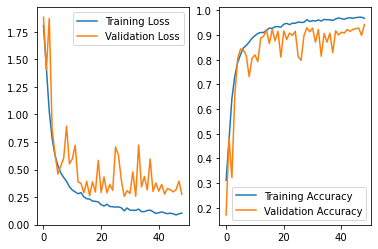

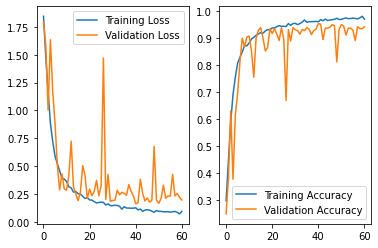

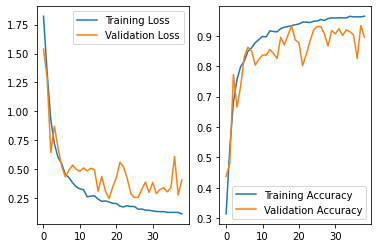

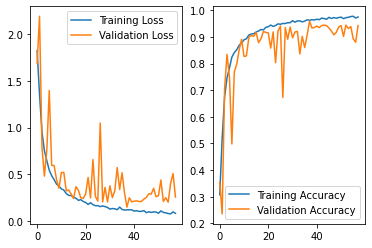

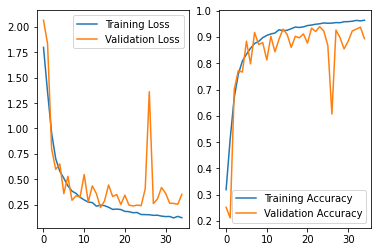

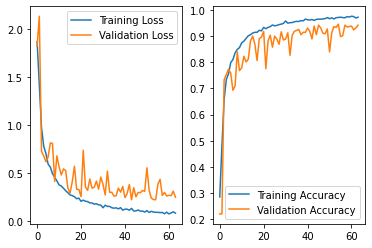

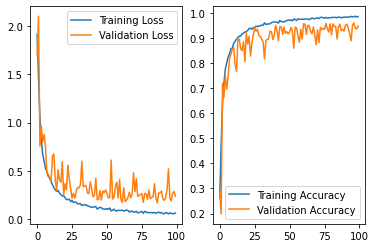

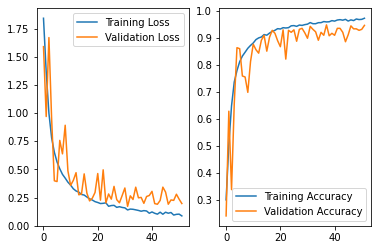

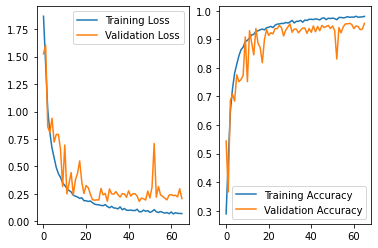

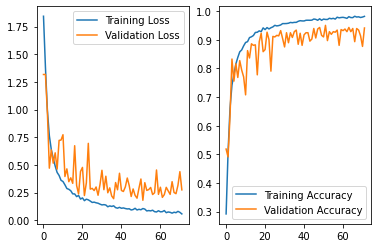

In [14]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [15]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.94166667 0.93202631 0.81683081 0.91435789 0.97478227 0.92408812
 0.70868713 0.93746486]
precision sdev by class [0.11814539 0.06012182 0.14650087 0.04363044 0.01483333 0.03600981
 0.12656942 0.03687674]
macro precision mean 0.8937380074183989
macro precision sdev 0.026407039365142528
recall mean [0.96666667 0.88141026 0.76893939 0.92287356 0.9651901  0.93675214
 0.83589744 0.91810976]
recall sdev [0.1        0.13053177 0.10525942 0.05635807 0.01245934 0.0373165
 0.09448118 0.05269439]
macro recall mean 0.8994799138382629
macro recall sdev 0.019977289732921774
f1 mean [0.94571429 0.89702206 0.78202249 0.91798076 0.96983512 0.9297846
 0.76049233 0.92683697]
f1 sdev [0.08422516 0.07273479 0.08814336 0.04480517 0.00804887 0.02828282
 0.0867159  0.03672668]
macro f1 mean 0.8912110762577182
macro f1 sdev 0.02007134892441171
accuracy mean 0.9360476117137135
accuracy sdev 0.010393212483436777


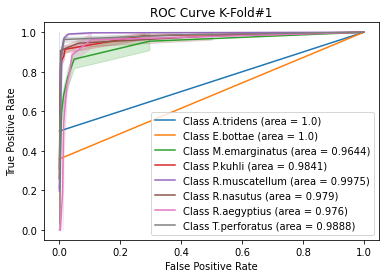

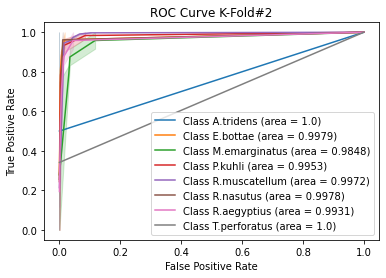

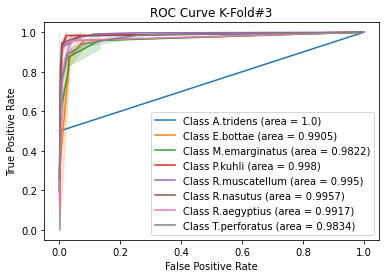

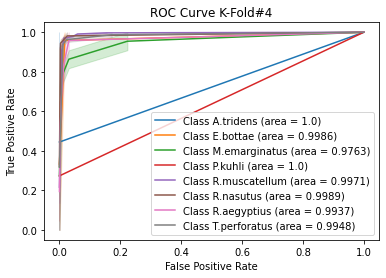

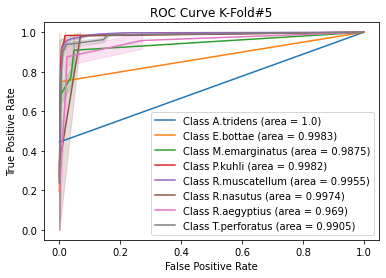

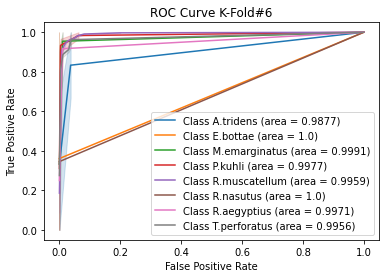

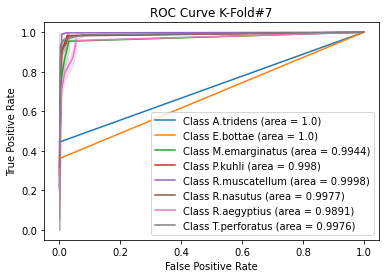

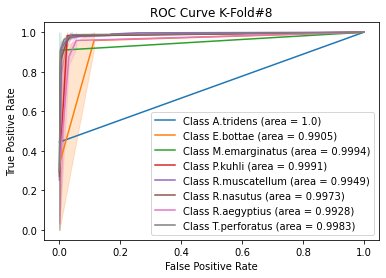

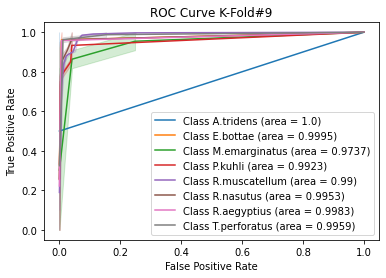

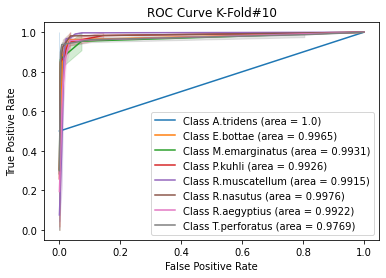

In [16]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [17]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.998773690078038
Std  0.0036789297658862624
Sp:  E.bottae
AUC Mean  0.9971737794431238
Std  0.0034911751677908693
Sp:  M.emarginatus
AUC Mean  0.9854687382175829
Std  0.010953714329207387
Sp:  P.kuhli
AUC Mean  0.9955352788168621
Std  0.004553895920635704
Sp:  R.muscatellum
AUC Mean  0.9954438347495888
Std  0.002754761779504253
Sp:  R.nasutus
AUC Mean  0.9956666853252065
Std  0.0057070354227287505
Sp:  R.aegyptius
AUC Mean  0.9892965927204086
Std  0.008894082238322946
Sp:  T.perforatus
AUC Mean  0.9921762047279593
Std  0.006969056705483098


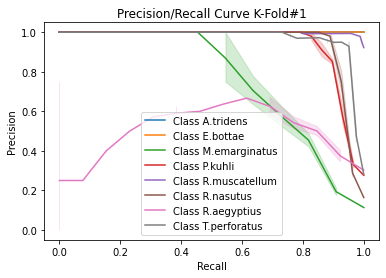

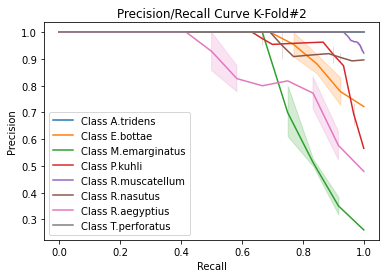

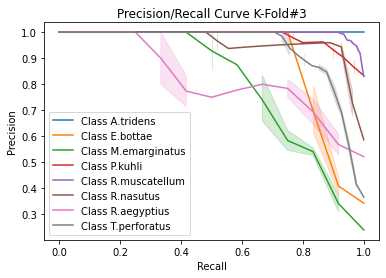

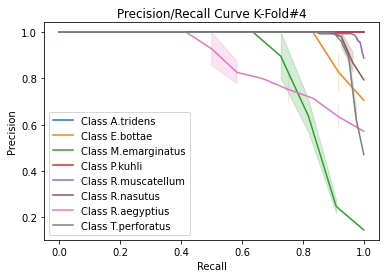

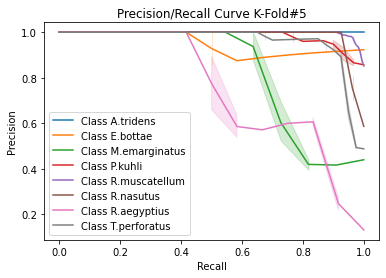

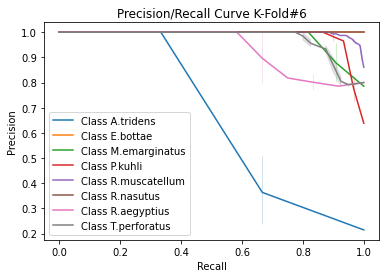

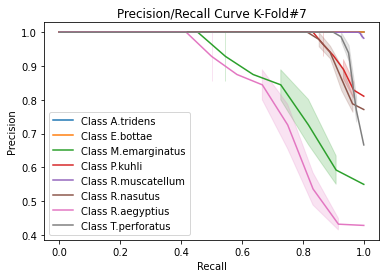

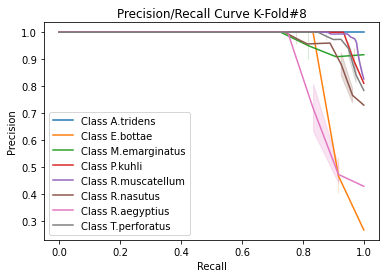

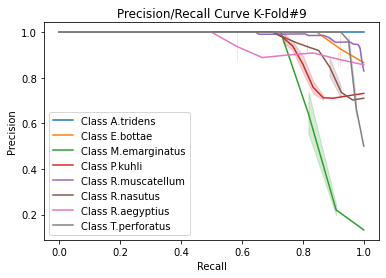

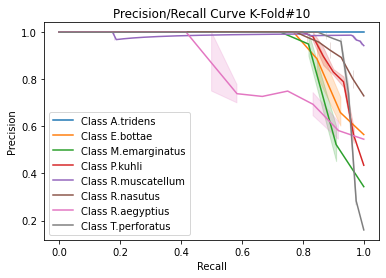

In [18]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   0   1   0   0]
 [  0   0   7   1   0   0   2   1]
 [  0   0   1  25   2   0   1   0]
 [  0   0   0   1 163   0   0   2]
 [  0   0   0   1   1  25   0   0]
 [  0   0   3   0   1   0   9   0]
 [  0   0   0   0   0   1   1  39]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0   7   0   0   3   3   0   0]
 [  0   0   9   2   1   0   0   0]
 [  0   0   0  29   1   0   0   0]
 [  0   0   1   1 162   0   2   0]
 [  0   0   0   1   1  24   0   0]
 [  1   0   0   1   0   0  10   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   8   1   1   0   2   0]
 [  0   0   0  28   1   1   0   0]
 [  0   0   0   0 161   0   2   3]
 [  0   0   0   1   0  26   0   0]
 [  0   0   0   1   1   0  10   0]
 [  0   1   1   0   4   1   1  33]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

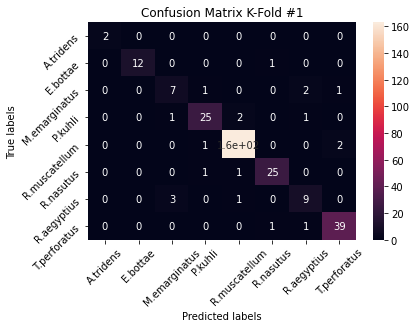

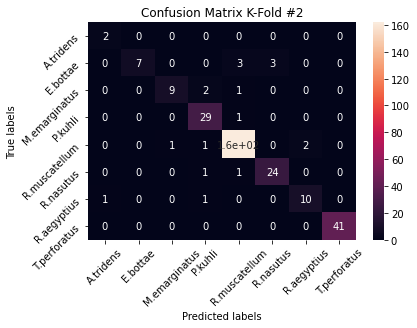

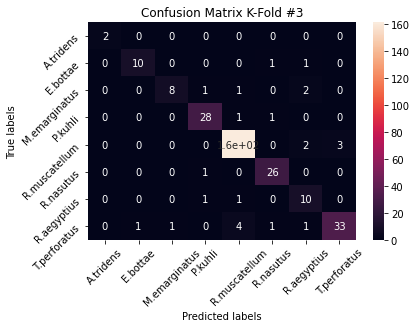

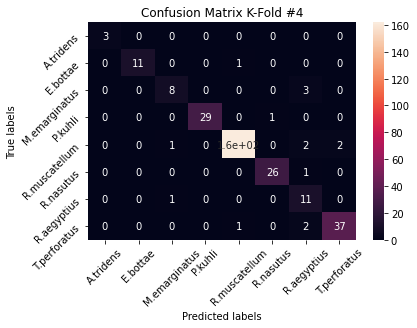

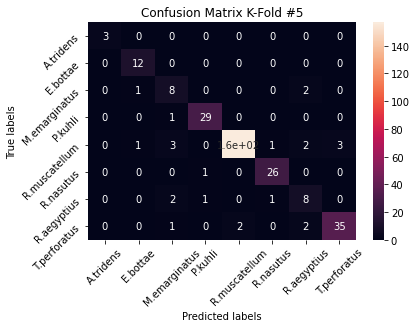

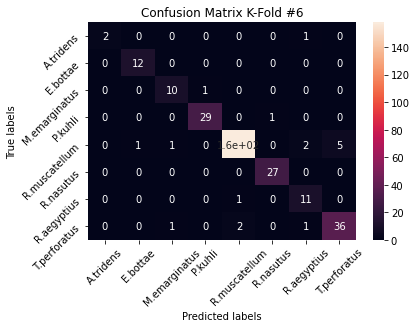

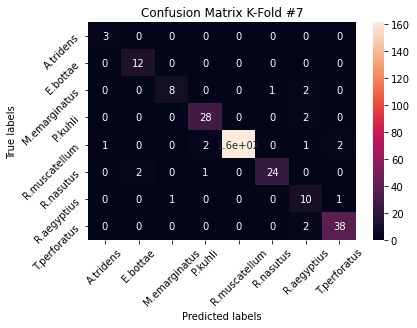

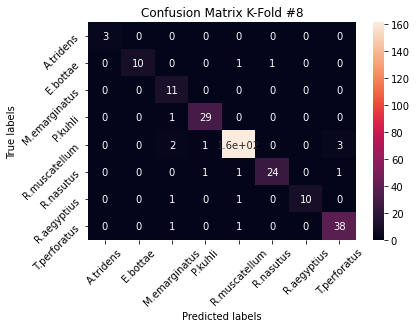

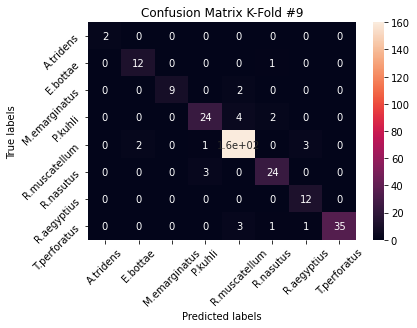

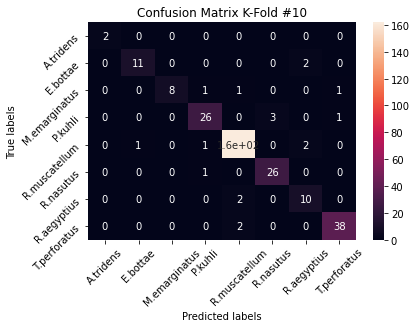

In [19]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  24    0    0    0    0    0    1    0]
 [   0  109    0    0    5    7    3    0]
 [   0    1   86    6    5    1   11    2]
 [   0    0    3  276    8    8    3    1]
 [   1    5    8    7 1607    1   16   20]
 [   0    2    0   10    3  252    1    1]
 [   1    0    8    3    6    1  101    1]
 [   0    1    4    0   15    3   10  370]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   0   0   0]
 [  0   0   8   0   0   0   1   0]
 [  0   0   0  27   0   0   0   0]
 [  0   0   0   0 160   0   1   2]
 [  0   0   0   1   0  25   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   1  37]]


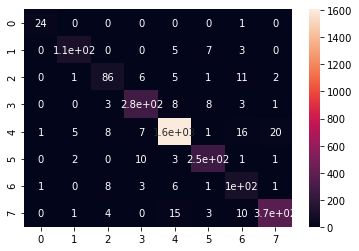

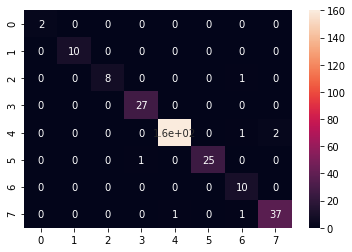

In [20]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.96 0.   0.   0.   0.   0.   0.04 0.  ]
 [0.   0.88 0.   0.   0.04 0.06 0.02 0.  ]
 [0.   0.01 0.77 0.05 0.04 0.01 0.1  0.02]
 [0.   0.   0.01 0.92 0.03 0.03 0.01 0.  ]
 [0.   0.   0.   0.   0.97 0.   0.01 0.01]
 [0.   0.01 0.   0.04 0.01 0.94 0.   0.  ]
 [0.01 0.   0.07 0.02 0.05 0.01 0.83 0.01]
 [0.   0.   0.01 0.   0.04 0.01 0.02 0.92]]


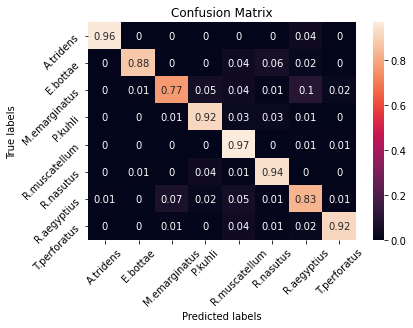

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V2 !!!!! K-Fold Training and Evaluation</h2>

In [8]:
folder = "models"
mode_version = "spec_smote_v2"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v2


In [31]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=24,kernel_size=(5,5),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=56,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=136,kernel_size=(7,7),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=120,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(512)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.4)(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.3)(lay)

    lay = Dense(128)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.2)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [34]:
model = build_current_model()
model.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 56, 85, 24)        1824      
_________________________________________________________________
batch_normalization_77 (Batc (None, 56, 85, 24)        96        
_________________________________________________________________
activation_77 (Activation)   (None, 56, 85, 24)        0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 28, 43, 24)        0         
_________________________________________________________________
spatial_dropout2d_44 (Spatia (None, 28, 43, 24)        0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 14, 22, 56)        336

In [35]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 6s - loss: 1.9129 - accuracy: 0.2709 - val_loss: 1.4201 - val_accuracy: 0.4908
Epoch 2/100
1199/1199 - 6s - loss: 1.4245 - accuracy: 0.4746 - val_loss: 1.0569 - val_accuracy: 0.5882
Epoch 3/100
1199/1199 - 6s - loss: 1.0104 - accuracy: 0.6428 - val_loss: 1.0177 - val_accuracy: 0.6452
Epoch 4/100
1199/1199 - 6s - loss: 0.7382 - accuracy: 0.7486 - val_loss: 0.7532 - val_accuracy: 0.7169
Epoch 5/100
1199/1199 - 5s - loss: 0.5919 - accuracy: 0.7969 - val_loss: 0.6437 - val_accuracy: 0.7500

Epoch 21/100
1199/1199 - 5s - loss: 0.1336 - accuracy: 0.9563 - val_loss: 0.1995 - val_accuracy: 0.9393
Epoch 22/100
1199/1199 - 5s - loss: 0.1252 - accuracy: 0.9606 - val_loss: 0.1954 - val_accuracy: 0.9338
Epoch 23/100
1199/1199 - 5s - loss: 0.1328 - accuracy: 0.9555 - val_loss: 0.1866 - val_accuracy: 0.9412
Epoch 24/100
1199/1199 - 6s - loss: 0.1248 - accuracy: 0.9613 - val_loss: 0.4053 - val_accuracy: 0.8713
Epoch 25/100
1199/1199 - 6s - loss: 0.1171 - accuracy: 0.9622 - val_loss: 0.3401 - val_accuracy: 0.8860
Epoch 26/100
1199/1199 - 6s - loss: 0.1207 - accuracy: 0.9633 - val_loss: 0.3561 - val_accuracy: 0.8879
Epoch 27/100
1199/1199 - 5s - loss: 0.1121 - accuracy: 0.9661 - val_loss: 0.4542 - val_accuracy: 0.8585
Epoch 28/100
1199/1199 - 6s - loss: 0.1073 - accuracy: 0.9650 - val_loss: 0.1641 - val_accuracy: 0.9522
Epoch 29/100
1199/1199 - 5s - loss: 0.1095 - accuracy: 0.9665 - val_loss: 0.2237 - val_accuracy: 0.9320
Epoch 30/100
1199/1199 - 5s - loss: 0.1003 - accuracy: 0.9670 - 

Epoch 30/100
1199/1199 - 5s - loss: 0.0913 - accuracy: 0.9690 - val_loss: 0.3087 - val_accuracy: 0.9283
Epoch 31/100
1199/1199 - 5s - loss: 0.0943 - accuracy: 0.9699 - val_loss: 0.3956 - val_accuracy: 0.8787
Epoch 32/100
1199/1199 - 5s - loss: 0.0760 - accuracy: 0.9770 - val_loss: 0.3471 - val_accuracy: 0.9099
Epoch 33/100
1199/1199 - 5s - loss: 0.0902 - accuracy: 0.9741 - val_loss: 0.3631 - val_accuracy: 0.9026
Epoch 34/100
1199/1199 - 6s - loss: 0.0802 - accuracy: 0.9747 - val_loss: 0.3036 - val_accuracy: 0.9246
Epoch 35/100
1199/1199 - 6s - loss: 0.0881 - accuracy: 0.9734 - val_loss: 0.4225 - val_accuracy: 0.9136
Epoch 36/100
1199/1199 - 6s - loss: 0.0773 - accuracy: 0.9755 - val_loss: 0.4588 - val_accuracy: 0.8952
Epoch 37/100
1199/1199 - 5s - loss: 0.0803 - accuracy: 0.9756 - val_loss: 0.2267 - val_accuracy: 0.9467
Epoch 38/100
1199/1199 - 5s - loss: 0.0773 - accuracy: 0.9758 - val_loss: 0.2940 - val_accuracy: 0.9246
Epoch 39/100
1199/1199 - 5s - loss: 0.0737 - accuracy: 0.9775 - 

Epoch 56/100
Restoring model weights from the end of the best epoch.
1198/1198 - 6s - loss: 0.0488 - accuracy: 0.9860 - val_loss: 0.4068 - val_accuracy: 0.8952
Epoch 00056: early stopping
models/spec_smote_v2_iter_4.model
INFO:tensorflow:Assets written to: models/spec_smote_v2_iter_4.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 5s - loss: 1.9775 - accuracy: 0.2489 - val_loss: 1.6310 - val_accuracy: 0.5092
Epoch 2/100
1198/1198 - 6s - loss: 1.4618 - accuracy: 0.4678 - val_loss: 1.4891 - val_accuracy: 0.4044
Epoch 3/10

Epoch 22/100
1198/1198 - 5s - loss: 0.1227 - accuracy: 0.9617 - val_loss: 0.3345 - val_accuracy: 0.9044
Epoch 23/100
1198/1198 - 5s - loss: 0.1232 - accuracy: 0.9630 - val_loss: 0.7074 - val_accuracy: 0.8235
Epoch 24/100
1198/1198 - 6s - loss: 0.1217 - accuracy: 0.9631 - val_loss: 0.3006 - val_accuracy: 0.9062
Epoch 25/100
1198/1198 - 6s - loss: 0.1167 - accuracy: 0.9655 - val_loss: 0.2461 - val_accuracy: 0.9283
Epoch 26/100
1198/1198 - 5s - loss: 0.1077 - accuracy: 0.9663 - val_loss: 0.2969 - val_accuracy: 0.9191
Epoch 27/100
1198/1198 - 5s - loss: 0.1153 - accuracy: 0.9654 - val_loss: 0.4054 - val_accuracy: 0.8805
Epoch 28/100
1198/1198 - 5s - loss: 0.1028 - accuracy: 0.9686 - val_loss: 0.3428 - val_accuracy: 0.9173
Epoch 29/100
1198/1198 - 6s - loss: 0.0970 - accuracy: 0.9695 - val_loss: 0.3905 - val_accuracy: 0.9062
Epoch 30/100
1198/1198 - 5s - loss: 0.0923 - accuracy: 0.9702 - val_loss: 0.3394 - val_accuracy: 0.9099
Epoch 31/100
1198/1198 - 5s - loss: 0.0938 - accuracy: 0.9715 - 

Epoch 54/100
1198/1198 - 6s - loss: 0.0692 - accuracy: 0.9804 - val_loss: 0.2971 - val_accuracy: 0.9026
Epoch 55/100
1198/1198 - 6s - loss: 0.0626 - accuracy: 0.9817 - val_loss: 0.2606 - val_accuracy: 0.9393
Epoch 56/100
1198/1198 - 6s - loss: 0.0596 - accuracy: 0.9835 - val_loss: 0.2984 - val_accuracy: 0.9210
Epoch 57/100
1198/1198 - 6s - loss: 0.0572 - accuracy: 0.9832 - val_loss: 0.3161 - val_accuracy: 0.9393
Epoch 58/100
1198/1198 - 5s - loss: 0.0583 - accuracy: 0.9846 - val_loss: 0.3470 - val_accuracy: 0.9044
Epoch 59/100
1198/1198 - 5s - loss: 0.0566 - accuracy: 0.9821 - val_loss: 0.2873 - val_accuracy: 0.9393
Epoch 60/100
1198/1198 - 5s - loss: 0.0484 - accuracy: 0.9847 - val_loss: 0.2319 - val_accuracy: 0.9522
Epoch 61/100
1198/1198 - 6s - loss: 0.0595 - accuracy: 0.9827 - val_loss: 0.4929 - val_accuracy: 0.8971
Epoch 62/100
1198/1198 - 5s - loss: 0.0484 - accuracy: 0.9858 - val_loss: 0.3761 - val_accuracy: 0.9191
Epoch 63/100
1198/1198 - 5s - loss: 0.0502 - accuracy: 0.9845 - 

Epoch 16/100
1199/1199 - 5s - loss: 0.1926 - accuracy: 0.9387 - val_loss: 0.3832 - val_accuracy: 0.8768
Epoch 17/100
1199/1199 - 6s - loss: 0.1811 - accuracy: 0.9454 - val_loss: 0.2066 - val_accuracy: 0.9375
Epoch 18/100
1199/1199 - 5s - loss: 0.1657 - accuracy: 0.9474 - val_loss: 0.3505 - val_accuracy: 0.9246
Epoch 19/100
1199/1199 - 6s - loss: 0.1655 - accuracy: 0.9494 - val_loss: 0.1669 - val_accuracy: 0.9522
Epoch 20/100
1199/1199 - 5s - loss: 0.1456 - accuracy: 0.9543 - val_loss: 0.2413 - val_accuracy: 0.9283
Epoch 21/100
1199/1199 - 5s - loss: 0.1449 - accuracy: 0.9553 - val_loss: 0.3682 - val_accuracy: 0.9099
Epoch 22/100
1199/1199 - 6s - loss: 0.1380 - accuracy: 0.9564 - val_loss: 0.2084 - val_accuracy: 0.9412
Epoch 23/100
1199/1199 - 6s - loss: 0.1267 - accuracy: 0.9601 - val_loss: 0.1592 - val_accuracy: 0.9559
Epoch 24/100
1199/1199 - 6s - loss: 0.1240 - accuracy: 0.9617 - val_loss: 0.2197 - val_accuracy: 0.9485
Epoch 25/100
1199/1199 - 6s - loss: 0.1239 - accuracy: 0.9610 - 

Epoch 46/100
1199/1199 - 5s - loss: 0.0719 - accuracy: 0.9803 - val_loss: 0.3293 - val_accuracy: 0.9228
Epoch 47/100
1199/1199 - 6s - loss: 0.0664 - accuracy: 0.9799 - val_loss: 0.2694 - val_accuracy: 0.9265
Epoch 48/100
1199/1199 - 6s - loss: 0.0676 - accuracy: 0.9786 - val_loss: 0.3212 - val_accuracy: 0.9265
Epoch 49/100
1199/1199 - 6s - loss: 0.0657 - accuracy: 0.9794 - val_loss: 0.3493 - val_accuracy: 0.9099
Epoch 50/100
1199/1199 - 5s - loss: 0.0542 - accuracy: 0.9837 - val_loss: 0.5276 - val_accuracy: 0.8732
Epoch 51/100
1199/1199 - 5s - loss: 0.0630 - accuracy: 0.9815 - val_loss: 0.4179 - val_accuracy: 0.9099
Epoch 52/100
Restoring model weights from the end of the best epoch.
1199/1199 - 5s - loss: 0.0569 - accuracy: 0.9828 - val_loss: 0.4167 - val_accuracy: 0.8934
Epoch 00052: early stopping
models/spec_smote_v2_iter_10.model
INFO:tensorflow:Assets written to: models/spec_smote_v2_iter_10.model/assets


# LOAD AND EVAL

In [9]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [10]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
   
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

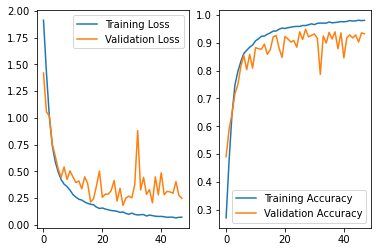

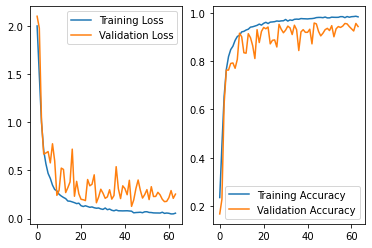

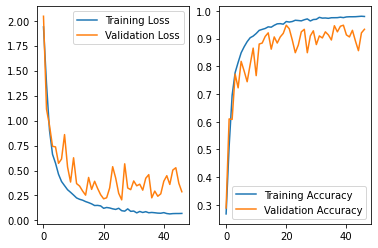

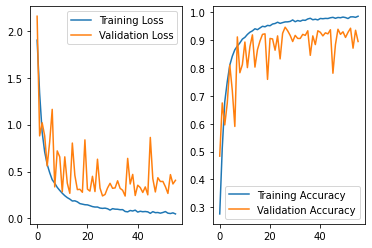

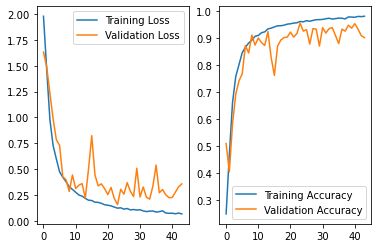

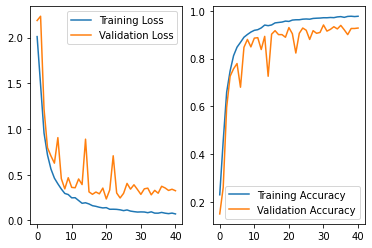

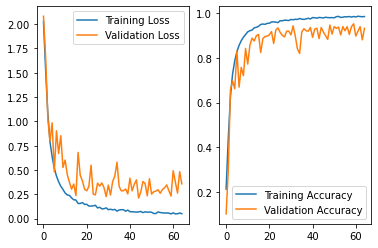

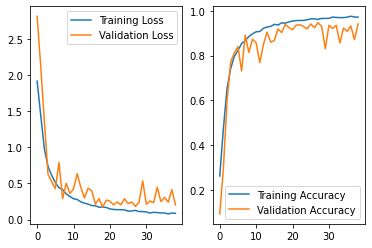

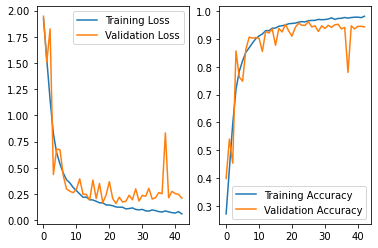

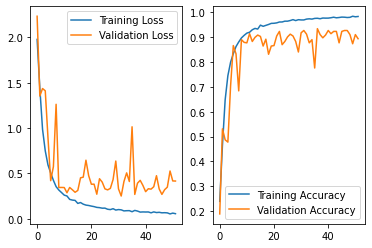

In [11]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [12]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.9261655  0.85270882 0.90041195 0.98125386 0.92446615
 0.71283578 0.9455088 ]
precision sdev by class [0.         0.05652083 0.09692923 0.05145879 0.01369378 0.04304695
 0.08789038 0.04004845]
macro precision mean 0.9054188578865805
macro precision sdev 0.019550595480968994
recall mean [0.93333333 0.89487179 0.85833333 0.93988506 0.96278046 0.92179487
 0.86153846 0.93042683]
recall sdev [0.2        0.0510572  0.11134302 0.03879562 0.01711418 0.05121256
 0.10439866 0.04119754]
macro recall mean 0.9128705180976746
macro recall sdev 0.01997248654263369
f1 mean [0.95       0.90956856 0.84573635 0.91885117 0.971778   0.92170699
 0.77749613 0.93736312]
f1 sdev [0.15       0.04780678 0.05350021 0.03617949 0.00988915 0.03140227
 0.08774259 0.03407042]
macro f1 mean 0.9040625398131468
macro f1 sdev 0.019816272914654605
accuracy mean 0.9413500253019735
accuracy sdev 0.006969868297065672


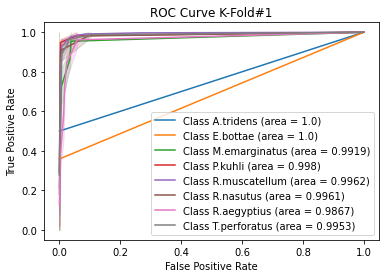

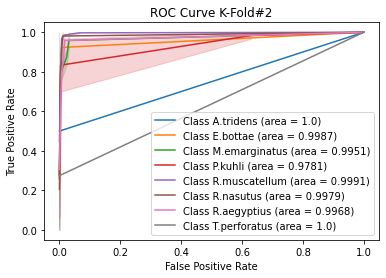

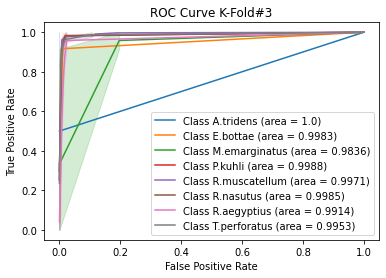

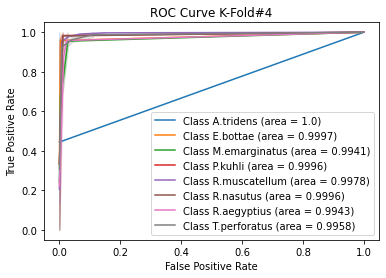

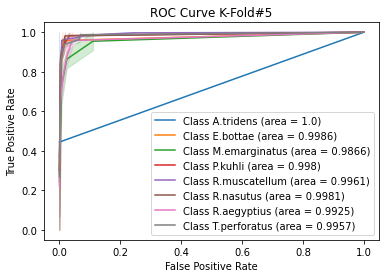

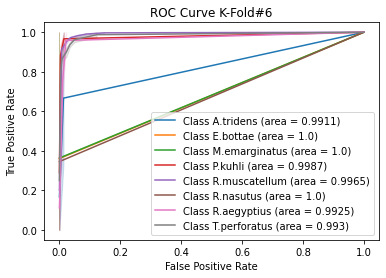

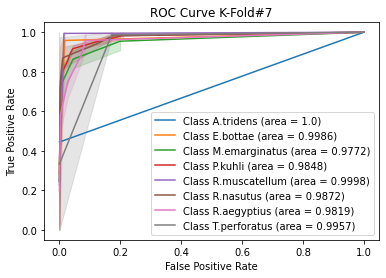

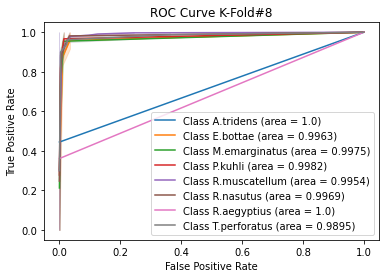

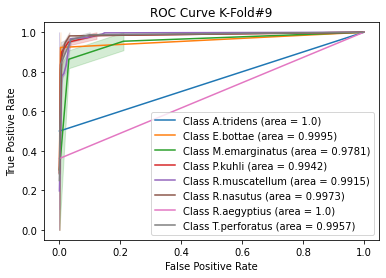

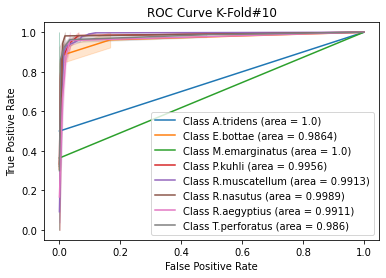

In [13]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [14]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9991081382385729
Std  0.0026755852842809463
Sp:  E.bottae
AUC Mean  0.997589247835713
Std  0.003881126222460556
Sp:  M.emarginatus
AUC Mean  0.9903996057266587
Std  0.008123923544696949
Sp:  P.kuhli
AUC Mean  0.9943897381351162
Std  0.00682027167284837
Sp:  R.muscatellum
AUC Mean  0.9960785518104668
Std  0.0026757256365619528
Sp:  R.nasutus
AUC Mean  0.9970555868723116
Std  0.0034729959577283202
Sp:  R.aegyptius
AUC Mean  0.9927177926873668
Std  0.005323771896133805
Sp:  T.perforatus
AUC Mean  0.9942111968204441
Std  0.003686514354883548


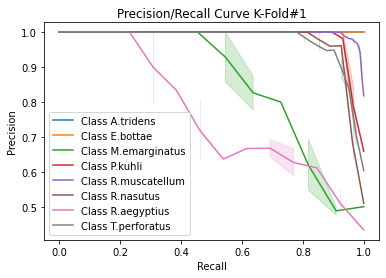

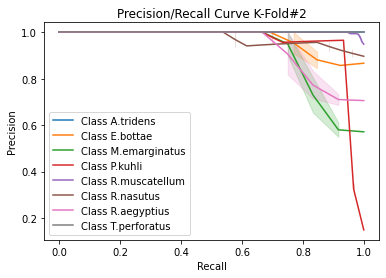

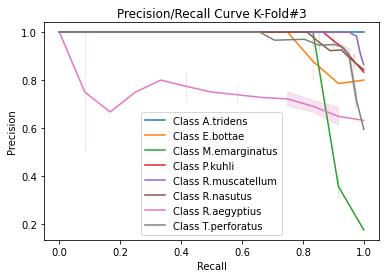

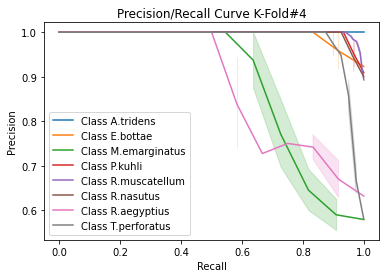

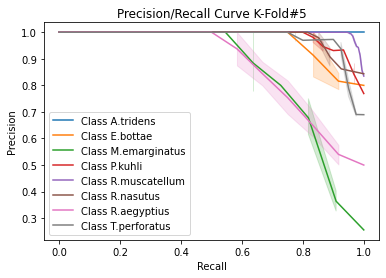

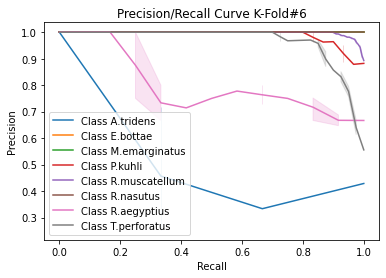

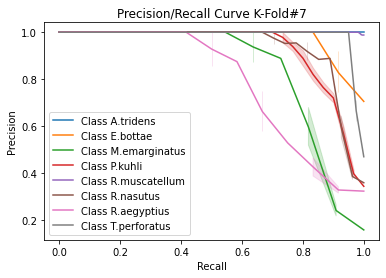

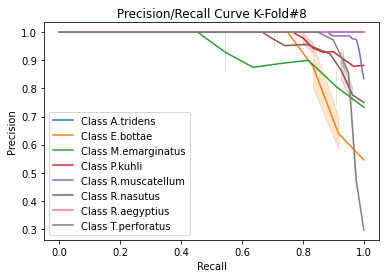

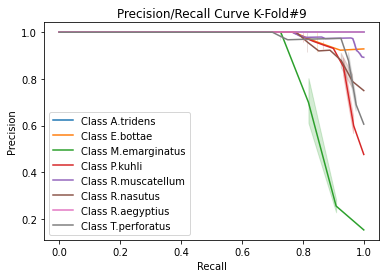

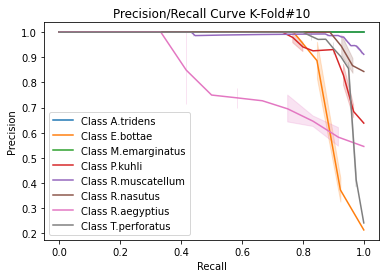

In [15]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   9   0   0   0   2   0]
 [  0   0   1  28   0   0   0   0]
 [  0   0   0   1 163   0   1   1]
 [  0   0   0   0   0  26   1   0]
 [  0   0   1   0   3   0   8   1]
 [  0   0   0   0   4   1   0  36]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   1   0   1   0]
 [  0   0   8   3   0   0   1   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   0   0 163   0   3   0]
 [  0   1   0   1   1  23   0   0]
 [  0   0   0   1   0   0  11   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  11   0   0   0   1   0]
 [  0   0   1  27   0   1   1   0]
 [  0   1   1   0 161   0   0   3]
 [  0   1   0   1   1  24   0   0]
 [  0   0   1   0   1   0  10   0]
 [  0   0   1   0   0   0   1  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

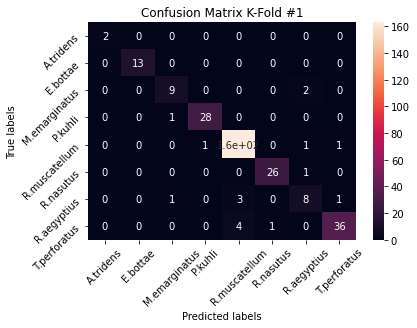

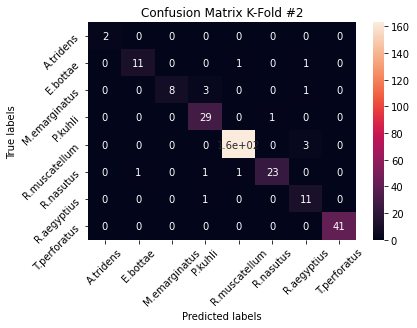

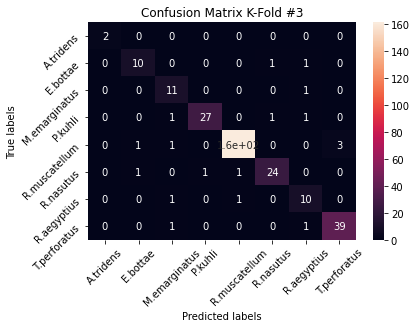

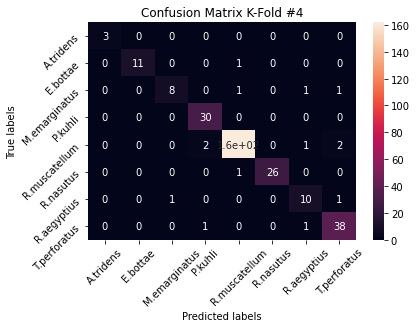

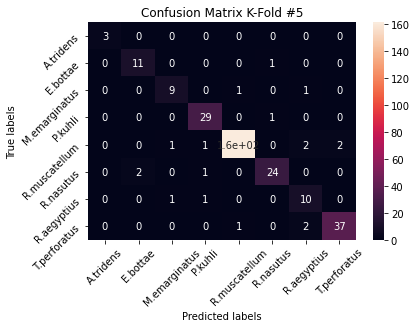

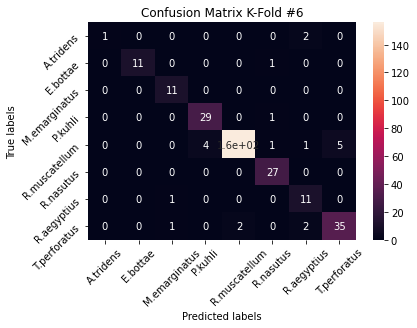

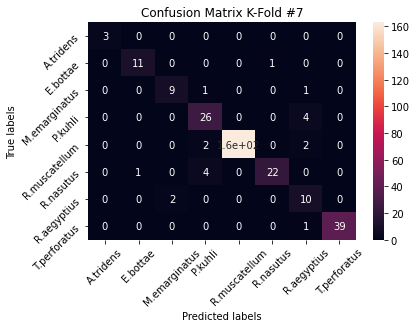

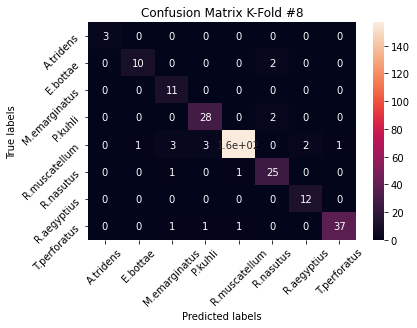

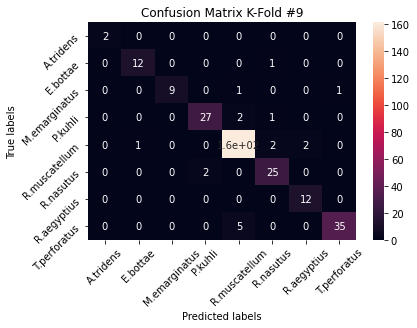

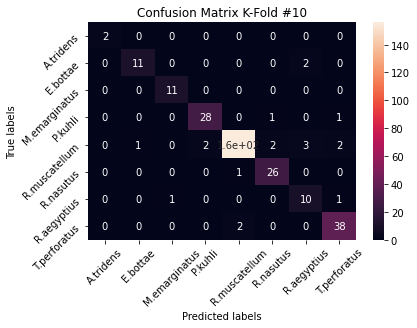

In [16]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  23    0    0    0    0    0    2    0]
 [   0  111    0    0    2    7    4    0]
 [   0    0   96    4    3    0    7    2]
 [   0    0    2  281    2    8    5    1]
 [   0    4    5   15 1603    5   17   16]
 [   0    5    1    9    5  248    1    0]
 [   0    0    8    2    4    0  104    3]
 [   0    0    3    2   15    1    7  375]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  28   0   0   0   0]
 [  0   0   0   1 160   0   1   1]
 [  0   0   0   0   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   0  37]]


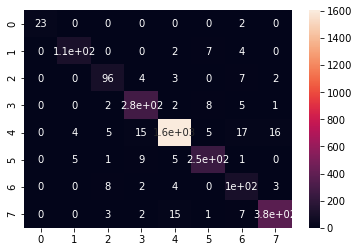

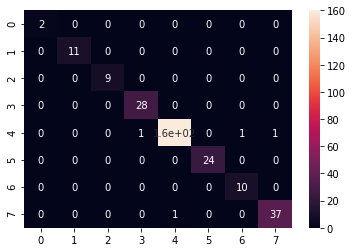

In [17]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.92 0.   0.   0.   0.   0.   0.08 0.  ]
 [0.   0.9  0.   0.   0.02 0.06 0.03 0.  ]
 [0.   0.   0.86 0.04 0.03 0.   0.06 0.02]
 [0.   0.   0.01 0.94 0.01 0.03 0.02 0.  ]
 [0.   0.   0.   0.01 0.96 0.   0.01 0.01]
 [0.   0.02 0.   0.03 0.02 0.92 0.   0.  ]
 [0.   0.   0.07 0.02 0.03 0.   0.86 0.02]
 [0.   0.   0.01 0.   0.04 0.   0.02 0.93]]


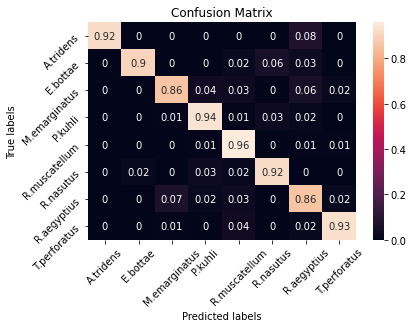

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V3 !!!!! K-Fold Training and Evaluation</h2>

In [12]:
folder = "models"
mode_version = "spec_smote_v3"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v3


In [13]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=176,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=144,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=192,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(144)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [14]:
model = build_current_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 176)       26048     
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 176)       704       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 176)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 176)       0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 176)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 22, 48)        211248

In [15]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 8s - loss: 1.8013 - accuracy: 0.3070 - val_loss: 2.0644 - val_accuracy: 0.5515
Epoch 2/100
1199/1199 - 8s - loss: 1.3515 - accuracy: 0.4975 - val_loss: 1.3916 - val_accuracy: 0.5018
Epoch 3/100
1199/1199 - 8s - loss: 0.9050 - accuracy: 0.6908 - val_loss: 0.9806 - val_accuracy: 0.6324
Epoch 4/100
1199/1199 - 8s - loss: 0.6692 - accuracy: 0.7745 - val_loss: 1.2753 - val_accuracy: 0.5643
Epoch 5/100
1199/1199 - 8s - loss: 0.5363 - accuracy: 0.8173 - val_loss: 0.4677 - val_accuracy: 0.8382

Epoch 29/100
1199/1199 - 9s - loss: 0.0973 - accuracy: 0.9685 - val_loss: 0.2077 - val_accuracy: 0.9265
Epoch 30/100
1199/1199 - 9s - loss: 0.0911 - accuracy: 0.9707 - val_loss: 0.2025 - val_accuracy: 0.9393
Epoch 31/100
1199/1199 - 9s - loss: 0.0993 - accuracy: 0.9671 - val_loss: 0.1954 - val_accuracy: 0.9357
Epoch 32/100
1199/1199 - 9s - loss: 0.0975 - accuracy: 0.9699 - val_loss: 0.2008 - val_accuracy: 0.9467
Epoch 33/100
1199/1199 - 9s - loss: 0.0887 - accuracy: 0.9735 - val_loss: 0.3124 - val_accuracy: 0.9044
Epoch 34/100
1199/1199 - 9s - loss: 0.0995 - accuracy: 0.9690 - val_loss: 0.1709 - val_accuracy: 0.9412
Epoch 35/100
1199/1199 - 9s - loss: 0.0914 - accuracy: 0.9701 - val_loss: 0.3642 - val_accuracy: 0.8897
Epoch 36/100
1199/1199 - 9s - loss: 0.0953 - accuracy: 0.9701 - val_loss: 0.3606 - val_accuracy: 0.9007
Epoch 37/100
1199/1199 - 9s - loss: 0.0875 - accuracy: 0.9739 - val_loss: 0.2582 - val_accuracy: 0.9246
Epoch 38/100
1199/1199 - 9s - loss: 0.0855 - accuracy: 0.9731 - 

Epoch 37/100
1199/1199 - 9s - loss: 0.0842 - accuracy: 0.9740 - val_loss: 0.2908 - val_accuracy: 0.9301
Epoch 38/100
1199/1199 - 9s - loss: 0.0773 - accuracy: 0.9775 - val_loss: 0.3020 - val_accuracy: 0.9357
Epoch 39/100
1199/1199 - 9s - loss: 0.0625 - accuracy: 0.9818 - val_loss: 0.2332 - val_accuracy: 0.9449
Epoch 40/100
1199/1199 - 9s - loss: 0.0820 - accuracy: 0.9765 - val_loss: 0.2733 - val_accuracy: 0.9210
Epoch 41/100
1199/1199 - 9s - loss: 0.0656 - accuracy: 0.9790 - val_loss: 0.2669 - val_accuracy: 0.9357
Epoch 42/100
1199/1199 - 9s - loss: 0.0711 - accuracy: 0.9795 - val_loss: 0.4008 - val_accuracy: 0.9154
Epoch 43/100
1199/1199 - 9s - loss: 0.0696 - accuracy: 0.9799 - val_loss: 0.3047 - val_accuracy: 0.9136
Epoch 44/100
1199/1199 - 9s - loss: 0.0586 - accuracy: 0.9818 - val_loss: 0.4790 - val_accuracy: 0.8860
Epoch 45/100
1199/1199 - 9s - loss: 0.0739 - accuracy: 0.9769 - val_loss: 0.2804 - val_accuracy: 0.9301
Epoch 46/100
1199/1199 - 9s - loss: 0.0583 - accuracy: 0.9828 - 

Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 9s - loss: 1.8599 - accuracy: 0.2874 - val_loss: 1.6688 - val_accuracy: 0.3382
Epoch 2/100
1198/1198 - 9s - loss: 1.3769 - accuracy: 0.5035 - val_loss: 1.7134 - val_accuracy: 0.3915
Epoch 3/100
1198/1198 - 9s - loss: 0.9666 - accuracy: 0.6589 - val_loss: 0.7671 - val_accuracy: 0.7316
Epoch 4/100
1198/1198 - 9s - loss: 0.7323 - accuracy: 0.7457 - val_loss: 1.2593 - val_accuracy: 0.5699
Epoch 5/100
1198/1198 - 9s - loss: 0.5914 - accuracy: 0.7966 - val_loss: 0.4549 - val_accuracy: 0.8658
Epoch 6/100
1198/1198 - 9s - loss: 0.4886 - accuracy: 0.8340 - val_loss: 0.5338 - val_accuracy: 0.8217
Epoch 7/100
1198/1198 - 9s - loss: 0.4092 - accuracy: 0.8649 - val_loss: 0.4389 - val_accur

Epoch 36/100
1198/1198 - 9s - loss: 0.0896 - accuracy: 0.9735 - val_loss: 0.2861 - val_accuracy: 0.9485
Epoch 37/100
1198/1198 - 9s - loss: 0.0732 - accuracy: 0.9759 - val_loss: 0.3161 - val_accuracy: 0.9301
Epoch 38/100
1198/1198 - 9s - loss: 0.0699 - accuracy: 0.9789 - val_loss: 0.3047 - val_accuracy: 0.9338
Epoch 39/100
1198/1198 - 9s - loss: 0.0813 - accuracy: 0.9760 - val_loss: 0.2763 - val_accuracy: 0.9449
Epoch 40/100
1198/1198 - 9s - loss: 0.0726 - accuracy: 0.9782 - val_loss: 0.4420 - val_accuracy: 0.8842
Epoch 41/100
1198/1198 - 9s - loss: 0.0702 - accuracy: 0.9775 - val_loss: 0.4310 - val_accuracy: 0.9007
Epoch 42/100
1198/1198 - 9s - loss: 0.0699 - accuracy: 0.9790 - val_loss: 0.3061 - val_accuracy: 0.9246
Epoch 43/100
1198/1198 - 9s - loss: 0.0751 - accuracy: 0.9769 - val_loss: 0.3211 - val_accuracy: 0.9357
Epoch 44/100
1198/1198 - 9s - loss: 0.0630 - accuracy: 0.9813 - val_loss: 0.3438 - val_accuracy: 0.9283
Epoch 45/100
1198/1198 - 9s - loss: 0.0631 - accuracy: 0.9809 - 

Epoch 42/100
1198/1198 - 9s - loss: 0.0666 - accuracy: 0.9779 - val_loss: 0.2320 - val_accuracy: 0.9540
Epoch 43/100
1198/1198 - 9s - loss: 0.0705 - accuracy: 0.9785 - val_loss: 0.3080 - val_accuracy: 0.9375
Epoch 44/100
1198/1198 - 9s - loss: 0.0728 - accuracy: 0.9775 - val_loss: 0.4017 - val_accuracy: 0.9210
Epoch 45/100
1198/1198 - 9s - loss: 0.0680 - accuracy: 0.9784 - val_loss: 0.5568 - val_accuracy: 0.8879
Epoch 46/100
1198/1198 - 9s - loss: 0.0627 - accuracy: 0.9805 - val_loss: 0.4514 - val_accuracy: 0.9007
Epoch 47/100
1198/1198 - 9s - loss: 0.0686 - accuracy: 0.9790 - val_loss: 0.3138 - val_accuracy: 0.9265
Epoch 48/100
1198/1198 - 9s - loss: 0.0568 - accuracy: 0.9828 - val_loss: 0.3458 - val_accuracy: 0.9136
Epoch 49/100
1198/1198 - 9s - loss: 0.0589 - accuracy: 0.9825 - val_loss: 0.2895 - val_accuracy: 0.9375
Epoch 50/100
1198/1198 - 9s - loss: 0.0600 - accuracy: 0.9807 - val_loss: 0.2736 - val_accuracy: 0.9504
Epoch 51/100
1198/1198 - 9s - loss: 0.0466 - accuracy: 0.9855 - 

Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 9s - loss: 1.8673 - accuracy: 0.2868 - val_loss: 1.8727 - val_accuracy: 0.2518
Epoch 2/100
1199/1199 - 9s - loss: 1.3856 - accuracy: 0.4869 - val_loss: 1.0857 - val_accuracy: 0.6085
Epoch 3/100
1199/1199 - 9s - loss: 0.9456 - accuracy: 0.6695 - val_loss: 1.0103 - val_accuracy: 0.6857
Epoch 4/100
1199/1199 - 9s - loss: 0.7244 - accuracy: 0.7499 - val_loss: 1.4923 - val_accuracy: 0.5074
Epoch 5/100
1199/1199 - 9s - loss: 0.5854 - accuracy: 0.8005 - val_loss: 0.4377 - val_accuracy: 0.8401

Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 9s - loss: 1.8606 - accuracy: 0.2916 - val_loss: 1.5665 - val_accuracy: 0.3989
Epoch 2/100
1199/1199 - 9s - loss: 1.3248 - accuracy: 0.5263 - val_loss: 2.2920 - val_accuracy: 0.1434
Epoch 3/100
1199/1199 - 9s - loss: 0.9001 - accuracy: 0.6886 - val_loss: 0.9218 - val_accuracy: 0.6820
Epoch 4/100
1199/1199 - 9s - loss: 0.7010 - accuracy: 0.7600 - val_loss: 0.5932 - val_accuracy: 0.7629
Epoch 5/100
1199/1199 - 9s - loss: 0.5674 - accuracy: 0.8108 - val_loss: 0.6574 - val_accuracy: 0.7684

# Load and Eval

In [16]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [17]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

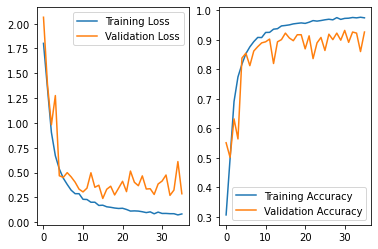

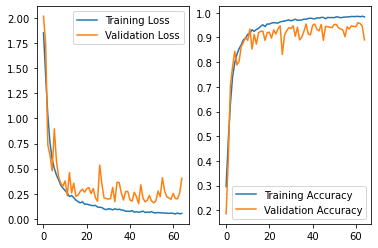

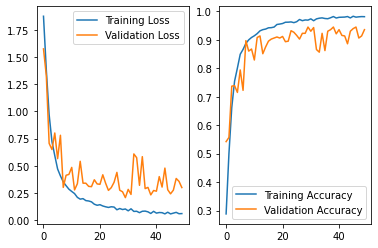

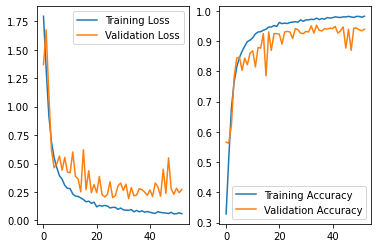

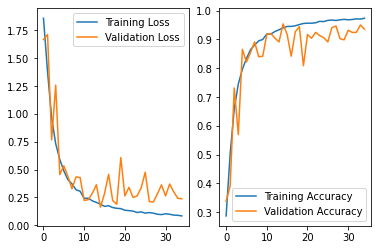

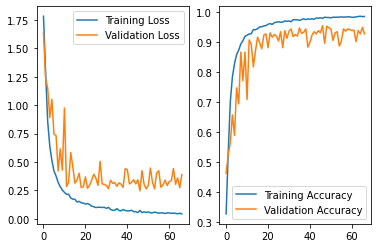

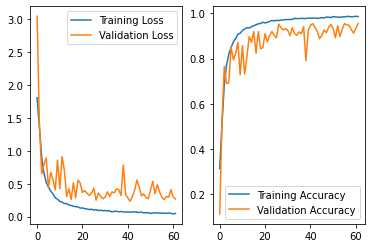

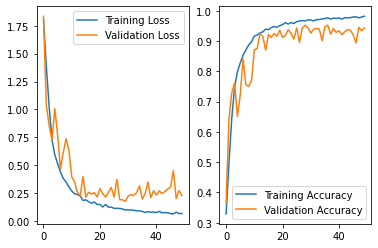

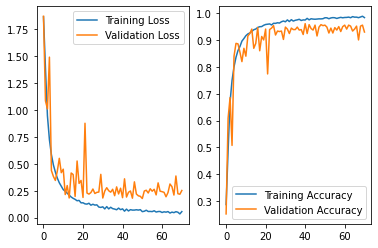

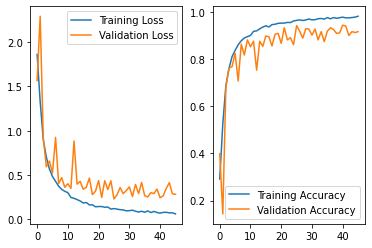

In [18]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [19]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.89391775 0.82286713 0.89499608 0.97772717 0.90744665
 0.75600927 0.93893766]
precision sdev by class [0.         0.0871545  0.1398216  0.05758132 0.01159844 0.03814935
 0.14302008 0.04333734]
macro precision mean 0.8989877151334144
macro precision sdev 0.022978981038610263
recall mean [0.9        0.88653846 0.80378788 0.90977011 0.96996248 0.89957265
 0.81858974 0.92792683]
recall sdev [0.21343747 0.09801825 0.10499738 0.03945142 0.01172131 0.0499399
 0.07109607 0.03434697]
macro recall mean 0.8895185202960961
macro recall sdev 0.025396430828456894
f1 mean [0.93       0.88672614 0.80107114 0.9012403  0.97375418 0.90276882
 0.78020375 0.93279873]
f1 sdev [0.15524175 0.07449523 0.07965977 0.03840957 0.00793826 0.03627135
 0.09674911 0.03137908]
macro f1 mean 0.8885703814450994
macro f1 sdev 0.02257282148343734
accuracy mean 0.9357186860575124
accuracy sdev 0.009400456966157973


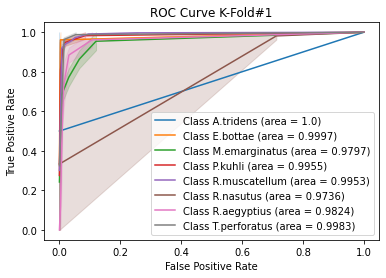

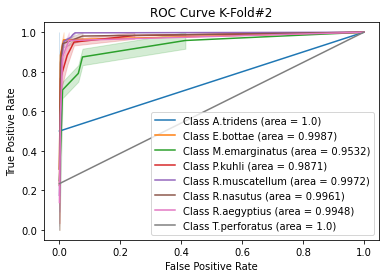

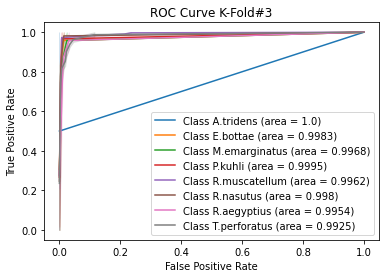

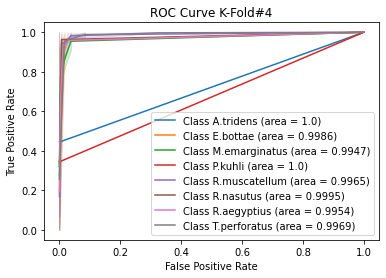

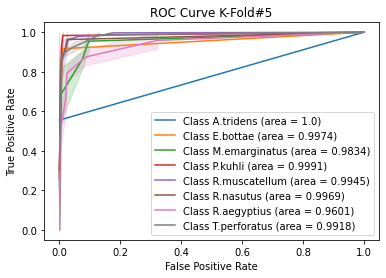

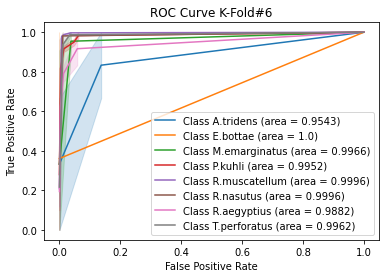

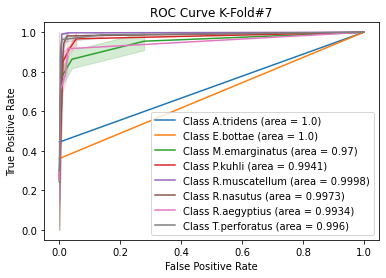

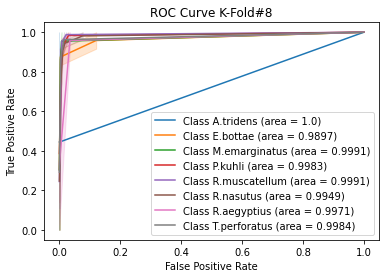

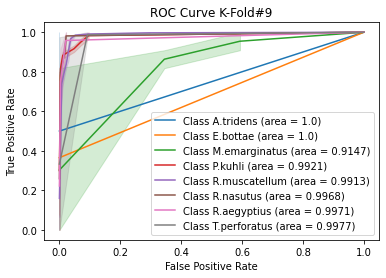

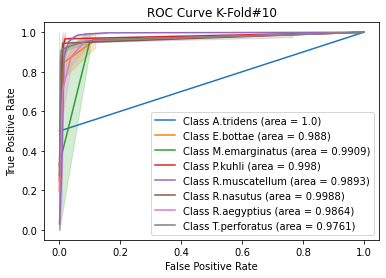

In [20]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [21]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9954292084726868
Std  0.013712374581939801
Sp:  E.bottae
AUC Mean  0.9970291796309724
Std  0.004204605738723129
Sp:  M.emarginatus
AUC Mean  0.9779104051535619
Std  0.025108200676734506
Sp:  P.kuhli
AUC Mean  0.9959019587383144
Std  0.0038147225527569635
Sp:  R.muscatellum
AUC Mean  0.9958870511988073
Std  0.003279984006485411
Sp:  R.nasutus
AUC Mean  0.9951368079479789
Std  0.007315178808394638
Sp:  R.aegyptius
AUC Mean  0.9890422093318525
Std  0.010747286494719725
Sp:  T.perforatus
AUC Mean  0.9943891025380378
Std  0.006546356381590212


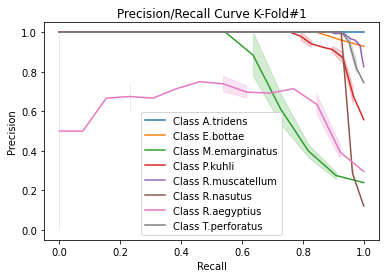

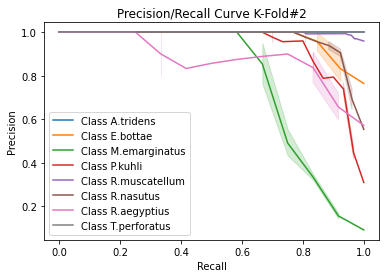

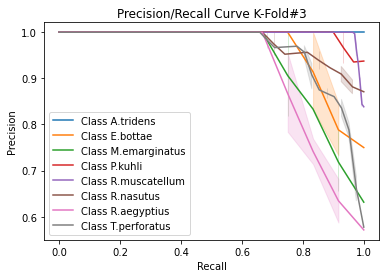

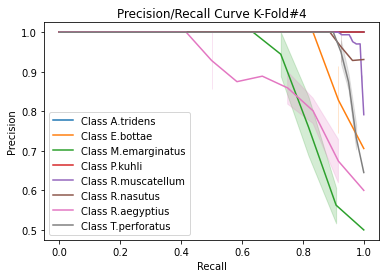

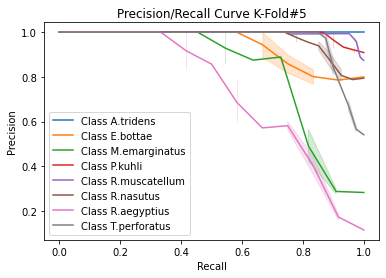

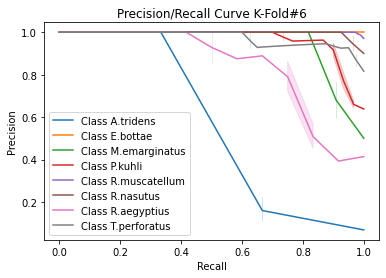

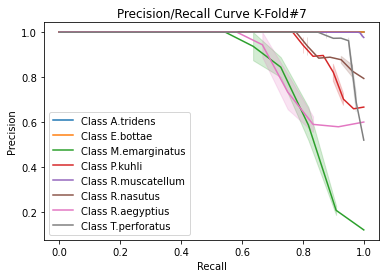

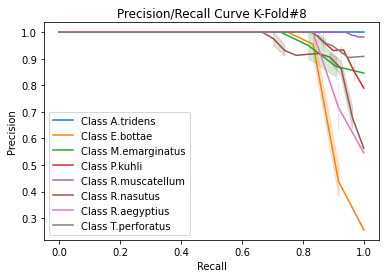

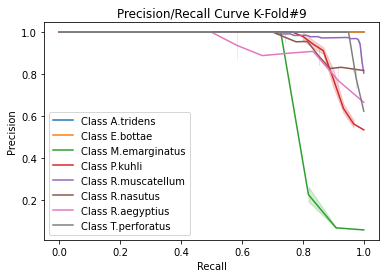

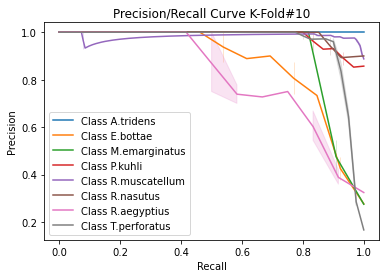

In [22]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   7   0   1   0   2   1]
 [  0   0   1  27   0   0   1   0]
 [  0   1   2   3 158   1   1   0]
 [  0   0   0   0   0  26   1   0]
 [  0   1   0   0   1   0  10   1]
 [  0   0   0   0   2   0   0  39]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   9   2   0   0   1   0]
 [  0   0   2  25   2   1   0   0]
 [  0   1   1   2 160   0   2   0]
 [  0   1   0   1   1  23   0   0]
 [  0   0   1   0   0   0  11   0]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  10   0   1   0   0   1]
 [  0   0   0  29   1   0   0   0]
 [  0   0   0   1 162   0   0   3]
 [  0   1   0   1   1  24   0   0]
 [  0   0   0   0   1   0   9   2]
 [  0   0   1   0   2   1   0  37]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

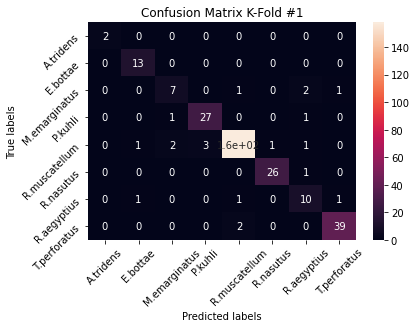

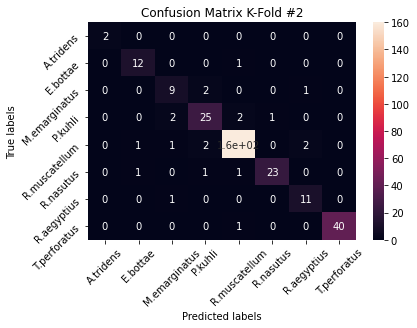

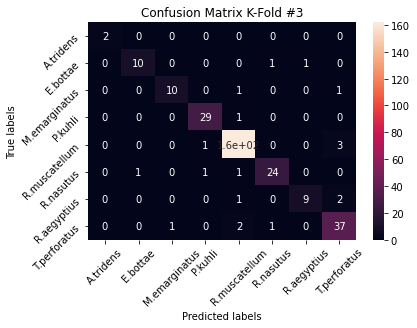

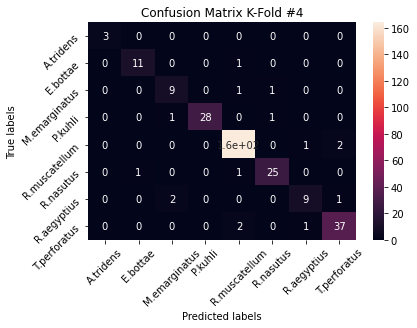

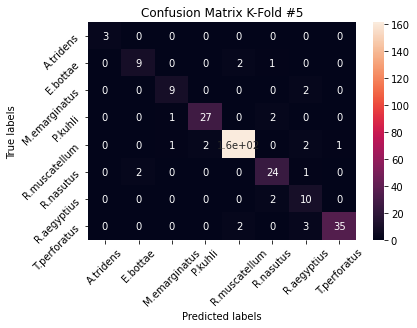

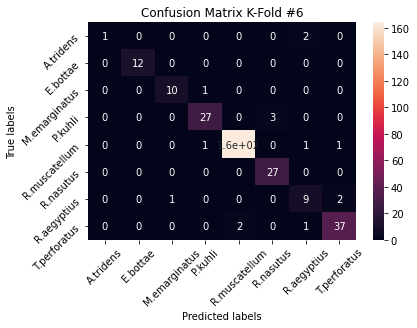

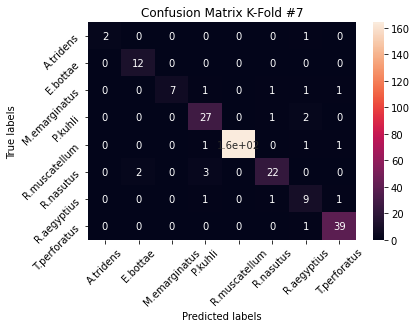

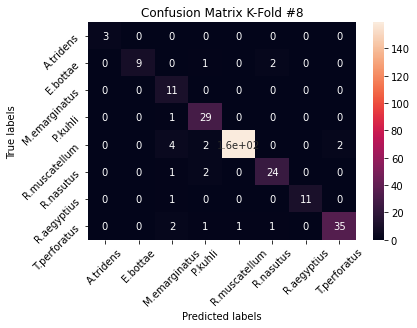

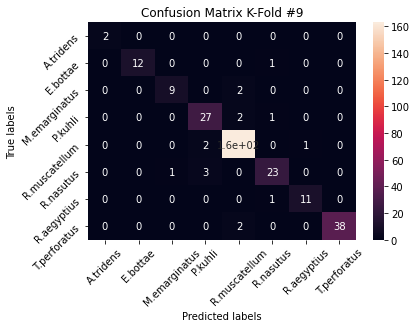

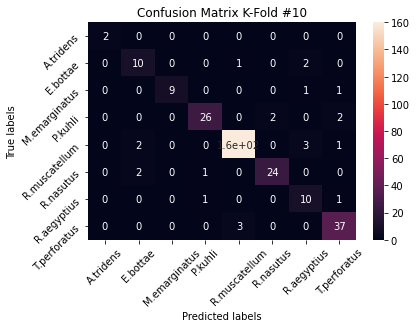

In [23]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  22    0    0    0    0    0    3    0]
 [   0  110    0    1    5    5    3    0]
 [   0    0   90    4    5    2    7    4]
 [   0    0    6  272    5   11    3    2]
 [   0    4    8   14 1615    1   12   11]
 [   0    9    2   11    3  242    2    0]
 [   0    1    5    2    2    4   99    8]
 [   0    0    3    1   17    2    6  374]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   1 161   0   1   1]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0   9   0]
 [  0   0   0   0   1   0   0  37]]


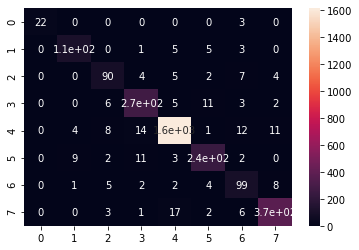

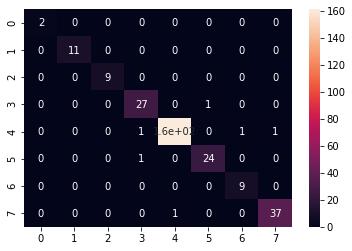

In [24]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.88 0.   0.   0.   0.   0.   0.12 0.  ]
 [0.   0.89 0.   0.01 0.04 0.04 0.02 0.  ]
 [0.   0.   0.8  0.04 0.04 0.02 0.06 0.04]
 [0.   0.   0.02 0.91 0.02 0.04 0.01 0.01]
 [0.   0.   0.   0.01 0.97 0.   0.01 0.01]
 [0.   0.03 0.01 0.04 0.01 0.9  0.01 0.  ]
 [0.   0.01 0.04 0.02 0.02 0.03 0.82 0.07]
 [0.   0.   0.01 0.   0.04 0.   0.01 0.93]]


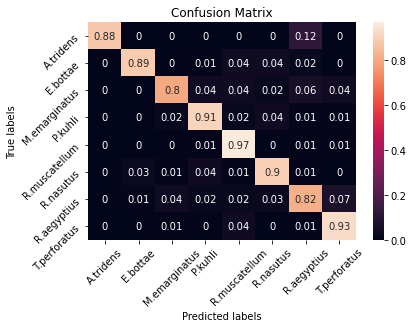

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V4 !!!!! K-Fold Training and Evaluation</h2>

In [34]:
folder = "models"
mode_version = "spec_smote_v4"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v4


In [35]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=160,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=80,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(448)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(352)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [36]:
model = build_current_model()
model.summary()

Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 56, 85, 160)       23680     
_________________________________________________________________
batch_normalization_84 (Batc (None, 56, 85, 160)       640       
_________________________________________________________________
activation_84 (Activation)   (None, 56, 85, 160)       0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 28, 43, 160)       0         
_________________________________________________________________
spatial_dropout2d_48 (Spatia (None, 28, 43, 160)       0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 14, 22, 112)       448

In [37]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 9s - loss: 1.8905 - accuracy: 0.3023 - val_loss: 1.8221 - val_accuracy: 0.2555
Epoch 2/100
1199/1199 - 9s - loss: 1.4086 - accuracy: 0.4882 - val_loss: 1.6579 - val_accuracy: 0.5662
Epoch 3/100
1199/1199 - 9s - loss: 0.9437 - accuracy: 0.6719 - val_loss: 0.8259 - val_accuracy: 0.6967
Epoch 4/100
1199/1199 - 9s - loss: 0.6766 - accuracy: 0.7662 - val_loss: 1.4848 - val_accuracy: 0.5827
Epoch 5/100
1199/1199 - 9s - loss: 0.5280 - accuracy: 0.8212 - val_loss: 0.7016 - val_accuracy: 0.7169

Epoch 75/100
1199/1199 - 10s - loss: 0.0352 - accuracy: 0.9895 - val_loss: 0.3674 - val_accuracy: 0.9301
Epoch 76/100
1199/1199 - 10s - loss: 0.0355 - accuracy: 0.9899 - val_loss: 0.3364 - val_accuracy: 0.9430
Epoch 77/100
1199/1199 - 10s - loss: 0.0409 - accuracy: 0.9880 - val_loss: 0.3739 - val_accuracy: 0.9062
Epoch 78/100
1199/1199 - 10s - loss: 0.0523 - accuracy: 0.9856 - val_loss: 0.2832 - val_accuracy: 0.9320
Epoch 79/100
1199/1199 - 10s - loss: 0.0295 - accuracy: 0.9919 - val_loss: 0.3585 - val_accuracy: 0.9173
Epoch 80/100
1199/1199 - 10s - loss: 0.0428 - accuracy: 0.9884 - val_loss: 0.3397 - val_accuracy: 0.9338
Epoch 81/100
1199/1199 - 10s - loss: 0.0311 - accuracy: 0.9903 - val_loss: 0.8244 - val_accuracy: 0.8070
Epoch 82/100
1199/1199 - 10s - loss: 0.0298 - accuracy: 0.9903 - val_loss: 0.3420 - val_accuracy: 0.9338
Epoch 83/100
1199/1199 - 10s - loss: 0.0356 - accuracy: 0.9904 - val_loss: 0.4273 - val_accuracy: 0.9246
Epoch 84/100
1199/1199 - 10s - loss: 0.0476 - accuracy:

Epoch 3/100
1199/1199 - 9s - loss: 0.8577 - accuracy: 0.7009 - val_loss: 1.1934 - val_accuracy: 0.6011
Epoch 4/100
1199/1199 - 9s - loss: 0.6287 - accuracy: 0.7843 - val_loss: 0.5036 - val_accuracy: 0.8162
Epoch 5/100
1199/1199 - 10s - loss: 0.5180 - accuracy: 0.8247 - val_loss: 0.7391 - val_accuracy: 0.7004
Epoch 6/100
1199/1199 - 10s - loss: 0.4274 - accuracy: 0.8533 - val_loss: 0.8342 - val_accuracy: 0.7482
Epoch 7/100
1199/1199 - 10s - loss: 0.3761 - accuracy: 0.8780 - val_loss: 0.3976 - val_accuracy: 0.8585
Epoch 8/100
1199/1199 - 10s - loss: 0.3376 - accuracy: 0.8884 - val_loss: 0.5635 - val_accuracy: 0.7996
Epoch 9/100
1199/1199 - 10s - loss: 0.2893 - accuracy: 0.9031 - val_loss: 0.5118 - val_accuracy: 0.8217
Epoch 10/100
1199/1199 - 10s - loss: 0.2574 - accuracy: 0.9147 - val_loss: 0.3158 - val_accuracy: 0.8915
Epoch 11/100
1199/1199 - 10s - loss: 0.2388 - accuracy: 0.9237 - val_loss: 0.3747 - val_accuracy: 0.8768
Epoch 12/100
1199/1199 - 10s - loss: 0.2209 - accuracy: 0.9303 -

Epoch 24/100
1198/1198 - 10s - loss: 0.1218 - accuracy: 0.9633 - val_loss: 0.3019 - val_accuracy: 0.9191
Epoch 25/100
1198/1198 - 10s - loss: 0.1242 - accuracy: 0.9583 - val_loss: 0.3298 - val_accuracy: 0.9062
Epoch 26/100
1198/1198 - 10s - loss: 0.1063 - accuracy: 0.9669 - val_loss: 0.2707 - val_accuracy: 0.9265
Epoch 27/100
1198/1198 - 10s - loss: 0.1081 - accuracy: 0.9669 - val_loss: 0.3184 - val_accuracy: 0.9173
Epoch 28/100
1198/1198 - 10s - loss: 0.1082 - accuracy: 0.9653 - val_loss: 0.2968 - val_accuracy: 0.9118
Epoch 29/100
1198/1198 - 10s - loss: 0.1051 - accuracy: 0.9670 - val_loss: 0.4731 - val_accuracy: 0.8603
Epoch 30/100
1198/1198 - 10s - loss: 0.1019 - accuracy: 0.9685 - val_loss: 0.4772 - val_accuracy: 0.8493
Epoch 31/100
1198/1198 - 10s - loss: 0.0989 - accuracy: 0.9684 - val_loss: 0.2809 - val_accuracy: 0.9228
Epoch 32/100
1198/1198 - 10s - loss: 0.0918 - accuracy: 0.9721 - val_loss: 0.3157 - val_accuracy: 0.9154
Epoch 33/100
1198/1198 - 10s - loss: 0.0925 - accuracy:

Epoch 11/100
1198/1198 - 10s - loss: 0.2307 - accuracy: 0.9244 - val_loss: 0.4603 - val_accuracy: 0.8695
Epoch 12/100
1198/1198 - 10s - loss: 0.2220 - accuracy: 0.9293 - val_loss: 0.3346 - val_accuracy: 0.8897
Epoch 13/100
1198/1198 - 10s - loss: 0.2028 - accuracy: 0.9341 - val_loss: 0.4874 - val_accuracy: 0.8364
Epoch 14/100
1198/1198 - 10s - loss: 0.1775 - accuracy: 0.9421 - val_loss: 0.2967 - val_accuracy: 0.9007
Epoch 15/100
1198/1198 - 10s - loss: 0.1721 - accuracy: 0.9439 - val_loss: 0.2700 - val_accuracy: 0.8989
Epoch 16/100
1198/1198 - 10s - loss: 0.1706 - accuracy: 0.9463 - val_loss: 0.2738 - val_accuracy: 0.9136
Epoch 17/100
1198/1198 - 10s - loss: 0.1494 - accuracy: 0.9525 - val_loss: 0.4670 - val_accuracy: 0.8438
Epoch 18/100
1198/1198 - 10s - loss: 0.1514 - accuracy: 0.9491 - val_loss: 0.4116 - val_accuracy: 0.8897
Epoch 19/100
1198/1198 - 10s - loss: 0.1401 - accuracy: 0.9560 - val_loss: 0.3183 - val_accuracy: 0.9044
Epoch 20/100
1198/1198 - 10s - loss: 0.1432 - accuracy:

Epoch 24/100
1198/1198 - 10s - loss: 0.1163 - accuracy: 0.9658 - val_loss: 0.4680 - val_accuracy: 0.8787
Epoch 25/100
1198/1198 - 10s - loss: 0.1129 - accuracy: 0.9643 - val_loss: 0.2990 - val_accuracy: 0.9265
Epoch 26/100
1198/1198 - 10s - loss: 0.0964 - accuracy: 0.9692 - val_loss: 0.4267 - val_accuracy: 0.8713
Epoch 27/100
1198/1198 - 10s - loss: 0.1025 - accuracy: 0.9682 - val_loss: 0.2834 - val_accuracy: 0.9338
Epoch 28/100
1198/1198 - 10s - loss: 0.1019 - accuracy: 0.9696 - val_loss: 0.3070 - val_accuracy: 0.9320
Epoch 29/100
1198/1198 - 10s - loss: 0.0997 - accuracy: 0.9694 - val_loss: 0.3048 - val_accuracy: 0.9320
Epoch 30/100
1198/1198 - 10s - loss: 0.0832 - accuracy: 0.9735 - val_loss: 0.3320 - val_accuracy: 0.9301
Epoch 31/100
1198/1198 - 10s - loss: 0.0922 - accuracy: 0.9698 - val_loss: 0.5401 - val_accuracy: 0.8640
Epoch 32/100
1198/1198 - 10s - loss: 0.0847 - accuracy: 0.9740 - val_loss: 0.2719 - val_accuracy: 0.9375
Epoch 33/100
1198/1198 - 10s - loss: 0.0893 - accuracy:

Epoch 9/100
1198/1198 - 10s - loss: 0.3186 - accuracy: 0.8977 - val_loss: 0.3420 - val_accuracy: 0.8860
Epoch 10/100
1198/1198 - 10s - loss: 0.2844 - accuracy: 0.9077 - val_loss: 0.4026 - val_accuracy: 0.8640
Epoch 11/100
1198/1198 - 10s - loss: 0.2397 - accuracy: 0.9198 - val_loss: 0.4804 - val_accuracy: 0.7960
Epoch 12/100
1198/1198 - 10s - loss: 0.2440 - accuracy: 0.9223 - val_loss: 0.2627 - val_accuracy: 0.9118
Epoch 13/100
1198/1198 - 10s - loss: 0.2206 - accuracy: 0.9279 - val_loss: 0.2663 - val_accuracy: 0.9062
Epoch 14/100
1198/1198 - 10s - loss: 0.1982 - accuracy: 0.9344 - val_loss: 0.2439 - val_accuracy: 0.9154
Epoch 15/100
1198/1198 - 10s - loss: 0.1849 - accuracy: 0.9393 - val_loss: 0.3125 - val_accuracy: 0.8860
Epoch 16/100
1198/1198 - 10s - loss: 0.1857 - accuracy: 0.9381 - val_loss: 0.3139 - val_accuracy: 0.9118
Epoch 17/100
1198/1198 - 10s - loss: 0.1637 - accuracy: 0.9498 - val_loss: 0.4321 - val_accuracy: 0.8566
Epoch 18/100
1198/1198 - 10s - loss: 0.1631 - accuracy: 

Epoch 27/100
1199/1199 - 10s - loss: 0.0974 - accuracy: 0.9707 - val_loss: 0.2997 - val_accuracy: 0.9154
Epoch 28/100
1199/1199 - 10s - loss: 0.0911 - accuracy: 0.9705 - val_loss: 0.3354 - val_accuracy: 0.9191
Epoch 29/100
1199/1199 - 10s - loss: 0.0985 - accuracy: 0.9699 - val_loss: 0.2300 - val_accuracy: 0.9412
Epoch 30/100
1199/1199 - 10s - loss: 0.0856 - accuracy: 0.9758 - val_loss: 0.3008 - val_accuracy: 0.9062
Epoch 31/100
1199/1199 - 10s - loss: 0.0858 - accuracy: 0.9738 - val_loss: 0.2996 - val_accuracy: 0.9283
Epoch 32/100
1199/1199 - 10s - loss: 0.0840 - accuracy: 0.9733 - val_loss: 0.2901 - val_accuracy: 0.9338
Epoch 33/100
1199/1199 - 10s - loss: 0.0838 - accuracy: 0.9742 - val_loss: 0.3013 - val_accuracy: 0.9228
Epoch 34/100
1199/1199 - 10s - loss: 0.0789 - accuracy: 0.9764 - val_loss: 0.2451 - val_accuracy: 0.9283
Epoch 35/100
1199/1199 - 10s - loss: 0.0832 - accuracy: 0.9733 - val_loss: 0.2516 - val_accuracy: 0.9357
Epoch 36/100
1199/1199 - 10s - loss: 0.0867 - accuracy:

# Load and eval

In [38]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8

In [39]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
        
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

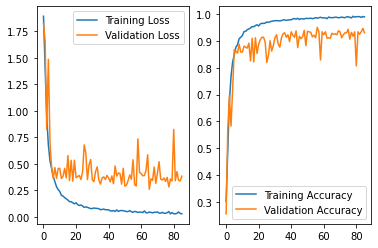

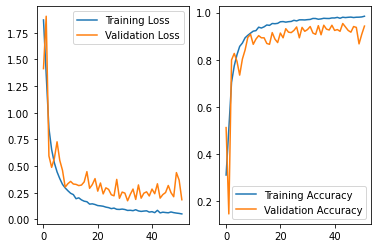

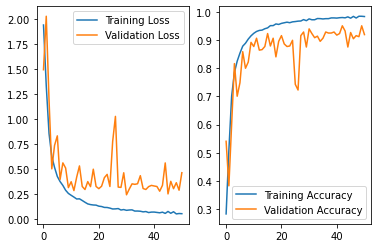

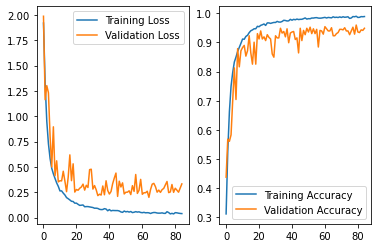

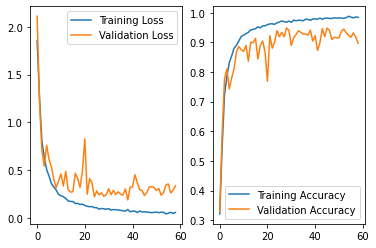

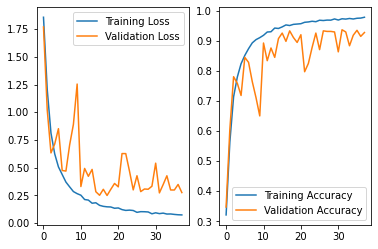

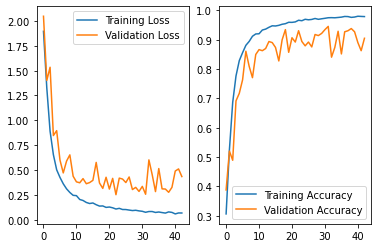

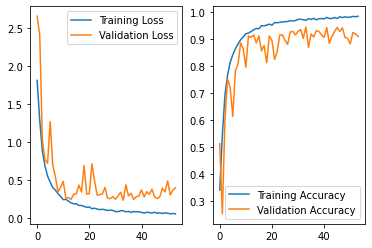

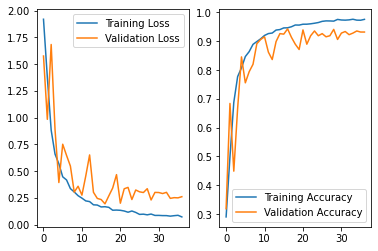

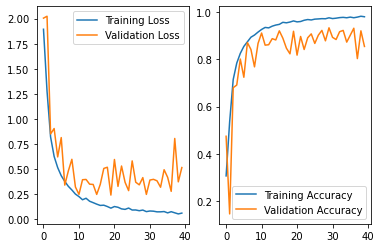

In [40]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [41]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.91302697 0.8369697  0.89715691 0.97989653 0.92818139
 0.69172557 0.91475084]
precision sdev by class [0.         0.0684092  0.10215414 0.07102156 0.00952568 0.03183083
 0.09302731 0.04827727]
macro precision mean 0.8952134889191553
macro precision sdev 0.018617275083346
recall mean [0.96666667 0.86474359 0.79545455 0.89954023 0.95854917 0.91438746
 0.86025641 0.9477439 ]
recall sdev [0.1        0.09211385 0.09748914 0.04254799 0.0191435  0.07053929
 0.11651159 0.03403843]
macro recall mean 0.9009177469449433
macro recall sdev 0.01927335173721055
f1 mean [0.98       0.88415808 0.80994537 0.89618622 0.96894644 0.92014586
 0.76054425 0.92972631]
f1 sdev [0.06       0.05674163 0.0773581  0.03920262 0.00906083 0.04559972
 0.07875395 0.02494868]
macro f1 mean 0.8937065667349209
macro f1 sdev 0.01755670935408212
accuracy mean 0.933392004576357
accuracy sdev 0.013078485027539215


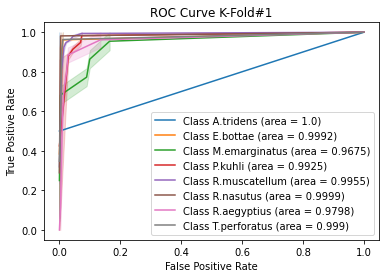

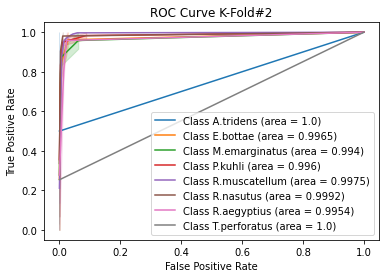

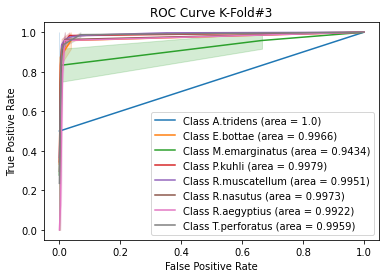

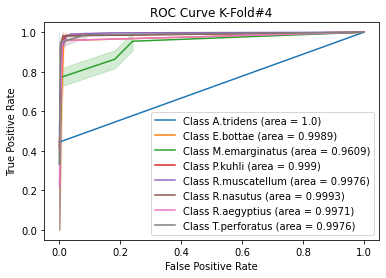

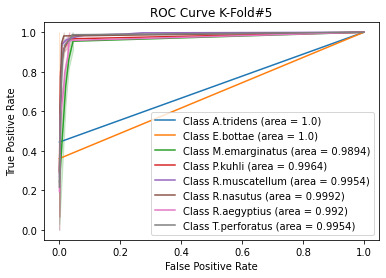

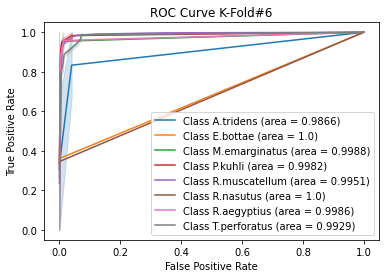

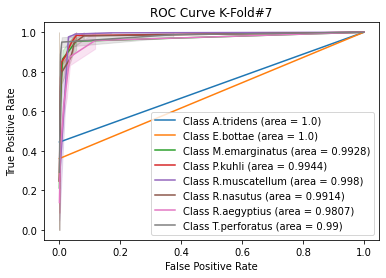

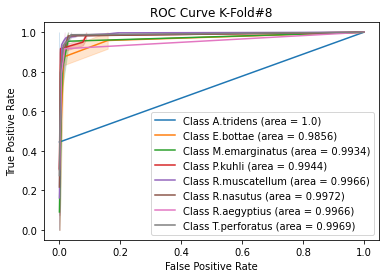

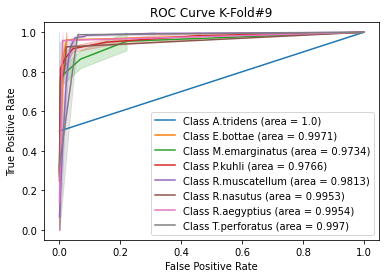

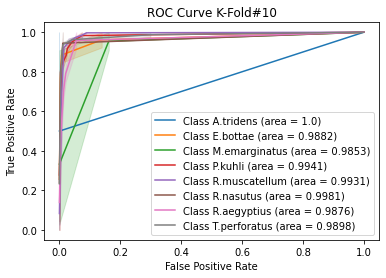

In [42]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [43]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9986622073578595
Std  0.0040133779264214025
Sp:  E.bottae
AUC Mean  0.9962085594756965
Std  0.004850269362246953
Sp:  M.emarginatus
AUC Mean  0.9798819873100001
Std  0.017059632781945815
Sp:  P.kuhli
AUC Mean  0.9939498879656006
Std  0.006097108396547906
Sp:  R.muscatellum
AUC Mean  0.9945260773829929
Std  0.004643298622467167
Sp:  R.nasutus
AUC Mean  0.9976782892108185
Std  0.0025186280557773716
Sp:  R.aegyptius
AUC Mean  0.9915344613426585
Std  0.0063760172426777515
Sp:  T.perforatus
AUC Mean  0.9954638451425314
Std  0.0033216639274508686


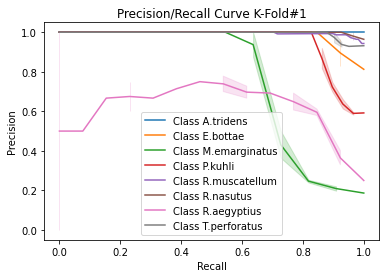

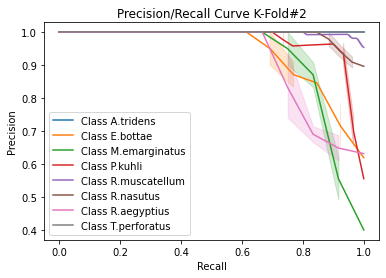

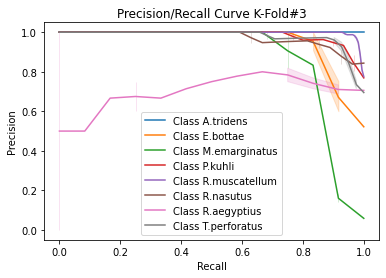

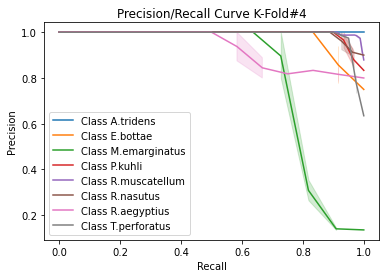

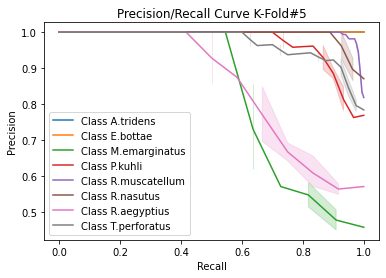

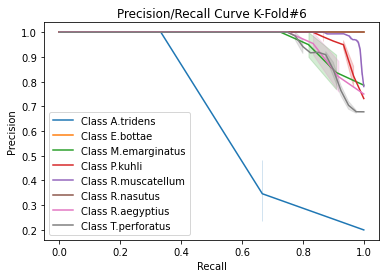

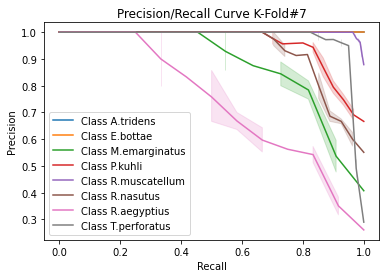

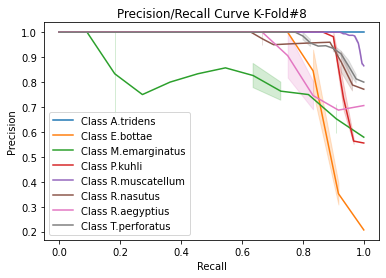

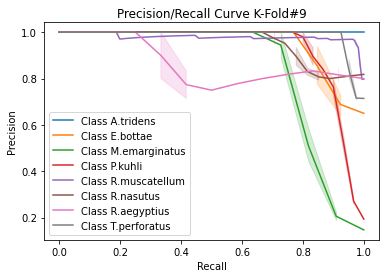

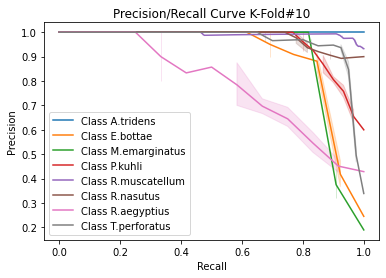

In [44]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   7   1   0   0   2   1]
 [  0   0   1  25   2   0   1   0]
 [  0   0   0   0 163   0   1   2]
 [  0   0   0   0   1  26   0   0]
 [  0   0   0   0   2   0  10   1]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0   9   0   0   0   2   1   1]
 [  0   0   9   2   0   0   1   0]
 [  0   0   0  29   1   0   0   0]
 [  0   0   1   3 153   0   4   5]
 [  0   1   0   1   0  23   1   0]
 [  0   0   0   1   0   0  11   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   9   0   0   0   3   0]
 [  0   0   1  25   2   1   1   0]
 [  0   1   0   0 162   0   2   1]
 [  0   0   0   1   1  24   1   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   1   0   1   0   2  37]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

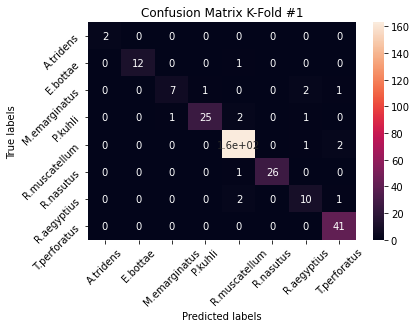

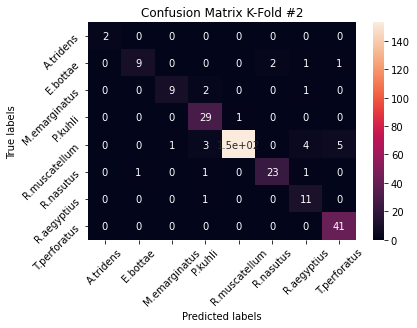

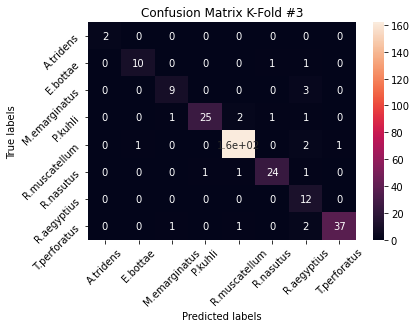

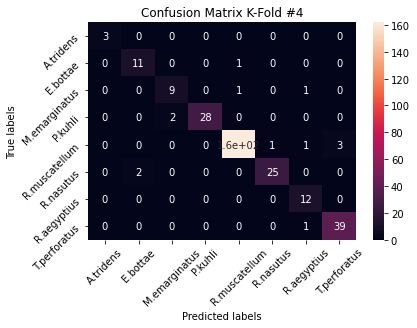

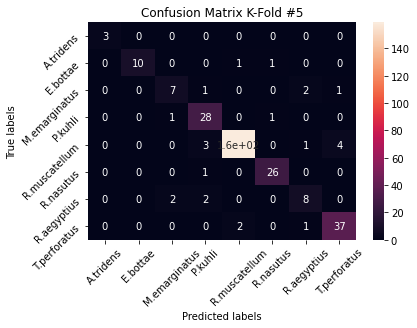

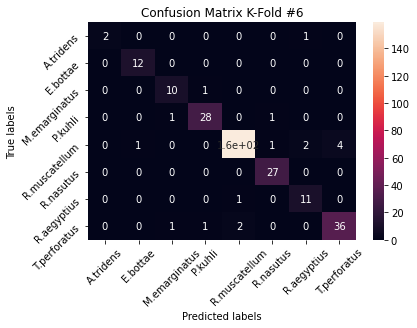

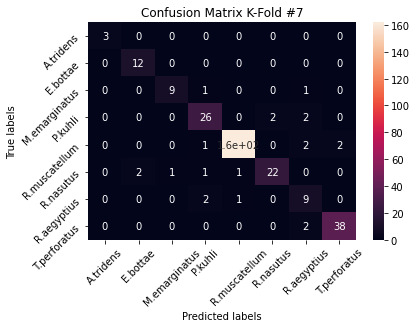

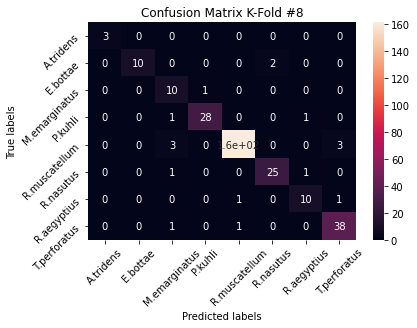

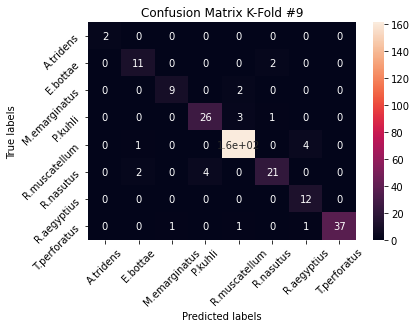

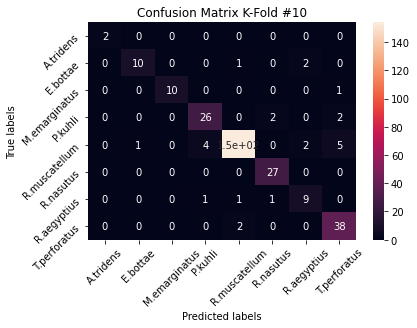

In [45]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  24    0    0    0    0    0    1    0]
 [   0  107    0    0    4    8    4    1]
 [   0    0   89    7    3    0   10    3]
 [   0    0    7  269    8    8    5    2]
 [   0    4    4   11 1596    2   19   29]
 [   0    7    2    8    3  246    3    0]
 [   0    0    2    6    6    1  104    2]
 [   0    0    4    1    9    0    7  382]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   0   0   0]
 [  0   0   8   0   0   0   1   0]
 [  0   0   0  26   0   0   0   0]
 [  0   0   0   1 159   0   1   2]
 [  0   0   0   0   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   0   0   0  38]]


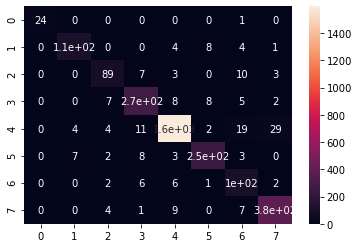

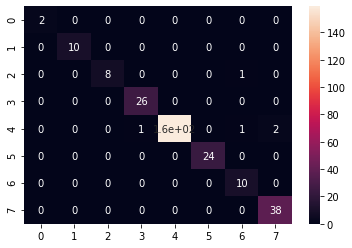

In [46]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.96 0.   0.   0.   0.   0.   0.04 0.  ]
 [0.   0.86 0.   0.   0.03 0.06 0.03 0.01]
 [0.   0.   0.79 0.06 0.03 0.   0.09 0.03]
 [0.   0.   0.02 0.9  0.03 0.03 0.02 0.01]
 [0.   0.   0.   0.01 0.96 0.   0.01 0.02]
 [0.   0.03 0.01 0.03 0.01 0.91 0.01 0.  ]
 [0.   0.   0.02 0.05 0.05 0.01 0.86 0.02]
 [0.   0.   0.01 0.   0.02 0.   0.02 0.95]]


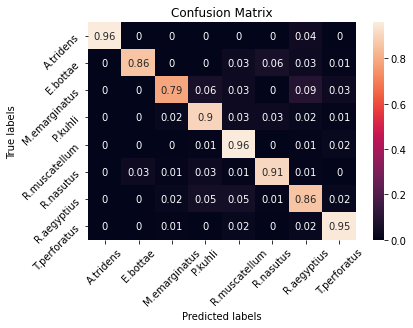

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V5 !!!!! K-Fold Training and Evaluation</h2>

In [48]:
folder = "models"
mode_version = "spec_smote_v5"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v5


In [49]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=48,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=32,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=128,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(112)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [50]:
model = build_current_model()
model.summary()

Model: "model_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_24 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_92 (Conv2D)           (None, 56, 85, 48)        7104      
_________________________________________________________________
batch_normalization_161 (Bat (None, 56, 85, 48)        192       
_________________________________________________________________
activation_161 (Activation)  (None, 56, 85, 48)        0         
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 28, 43, 48)        0         
_________________________________________________________________
spatial_dropout2d_92 (Spatia (None, 28, 43, 48)        0         
_________________________________________________________________
conv2d_93 (Conv2D)           (None, 14, 22, 32)        384

In [51]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.7338 - accuracy: 0.3485 - val_loss: 1.2593 - val_accuracy: 0.5331
Epoch 2/100
1199/1199 - 5s - loss: 1.1811 - accuracy: 0.5863 - val_loss: 1.2009 - val_accuracy: 0.5331
Epoch 3/100
1199/1199 - 4s - loss: 0.7883 - accuracy: 0.7266 - val_loss: 1.0667 - val_accuracy: 0.5643
Epoch 4/100
1199/1199 - 5s - loss: 0.5912 - accuracy: 0.8014 - val_loss: 0.5661 - val_accuracy: 0.8107
Epoch 5/100
1199/1199 - 5s - loss: 0.4665 - accuracy: 0.8484 - val_loss: 0.6077 - val_accuracy: 0.7739

Epoch 17/100
1199/1199 - 5s - loss: 0.1820 - accuracy: 0.9423 - val_loss: 0.3209 - val_accuracy: 0.8952
Epoch 18/100
1199/1199 - 4s - loss: 0.2006 - accuracy: 0.9311 - val_loss: 0.3649 - val_accuracy: 0.8658
Epoch 19/100
1199/1199 - 6s - loss: 0.1751 - accuracy: 0.9425 - val_loss: 0.2965 - val_accuracy: 0.9026
Epoch 20/100
1199/1199 - 5s - loss: 0.1781 - accuracy: 0.9405 - val_loss: 0.4795 - val_accuracy: 0.8511
Epoch 21/100
1199/1199 - 5s - loss: 0.1771 - accuracy: 0.9406 - val_loss: 0.2730 - val_accuracy: 0.9173
Epoch 22/100
1199/1199 - 5s - loss: 0.1584 - accuracy: 0.9494 - val_loss: 0.2632 - val_accuracy: 0.9338
Epoch 23/100
1199/1199 - 5s - loss: 0.1483 - accuracy: 0.9510 - val_loss: 0.2597 - val_accuracy: 0.9191
Epoch 24/100
1199/1199 - 5s - loss: 0.1470 - accuracy: 0.9527 - val_loss: 0.2320 - val_accuracy: 0.9301
Epoch 25/100
1199/1199 - 6s - loss: 0.1331 - accuracy: 0.9579 - val_loss: 0.2193 - val_accuracy: 0.9265
Epoch 26/100
1199/1199 - 5s - loss: 0.1361 - accuracy: 0.9569 - 

Epoch 16/100
1199/1199 - 6s - loss: 0.1772 - accuracy: 0.9427 - val_loss: 0.2924 - val_accuracy: 0.9136
Epoch 17/100
1199/1199 - 5s - loss: 0.1692 - accuracy: 0.9472 - val_loss: 0.3028 - val_accuracy: 0.9044
Epoch 18/100
1199/1199 - 6s - loss: 0.1835 - accuracy: 0.9404 - val_loss: 0.5360 - val_accuracy: 0.8217
Epoch 19/100
1199/1199 - 5s - loss: 0.1658 - accuracy: 0.9446 - val_loss: 0.2601 - val_accuracy: 0.9099
Epoch 20/100
1199/1199 - 5s - loss: 0.1567 - accuracy: 0.9499 - val_loss: 0.2754 - val_accuracy: 0.9173
Epoch 21/100
1199/1199 - 6s - loss: 0.1535 - accuracy: 0.9507 - val_loss: 0.3585 - val_accuracy: 0.8971
Epoch 22/100
1199/1199 - 5s - loss: 0.1457 - accuracy: 0.9541 - val_loss: 0.4921 - val_accuracy: 0.8529
Epoch 23/100
1199/1199 - 5s - loss: 0.1367 - accuracy: 0.9573 - val_loss: 0.3046 - val_accuracy: 0.9007
Epoch 24/100
1199/1199 - 5s - loss: 0.1417 - accuracy: 0.9551 - val_loss: 0.2440 - val_accuracy: 0.9228
Epoch 25/100
1199/1199 - 5s - loss: 0.1262 - accuracy: 0.9615 - 

Epoch 32/100
1198/1198 - 5s - loss: 0.1066 - accuracy: 0.9662 - val_loss: 0.2276 - val_accuracy: 0.9393
Epoch 33/100
1198/1198 - 5s - loss: 0.1000 - accuracy: 0.9654 - val_loss: 0.3111 - val_accuracy: 0.9044
Epoch 34/100
1198/1198 - 5s - loss: 0.0973 - accuracy: 0.9680 - val_loss: 0.6149 - val_accuracy: 0.8511
Epoch 35/100
1198/1198 - 5s - loss: 0.0872 - accuracy: 0.9706 - val_loss: 0.7286 - val_accuracy: 0.8309
Epoch 36/100
1198/1198 - 5s - loss: 0.1057 - accuracy: 0.9654 - val_loss: 0.2389 - val_accuracy: 0.9338
Epoch 37/100
1198/1198 - 5s - loss: 0.0873 - accuracy: 0.9714 - val_loss: 0.1983 - val_accuracy: 0.9485
Epoch 38/100
1198/1198 - 5s - loss: 0.0935 - accuracy: 0.9697 - val_loss: 0.2228 - val_accuracy: 0.9375
Epoch 39/100
1198/1198 - 5s - loss: 0.0846 - accuracy: 0.9722 - val_loss: 0.2526 - val_accuracy: 0.9357
Epoch 40/100
1198/1198 - 6s - loss: 0.0869 - accuracy: 0.9731 - val_loss: 0.2277 - val_accuracy: 0.9467
Epoch 41/100
1198/1198 - 5s - loss: 0.0828 - accuracy: 0.9729 - 

Epoch 48/100
1198/1198 - 5s - loss: 0.0696 - accuracy: 0.9777 - val_loss: 0.2106 - val_accuracy: 0.9430
Epoch 49/100
1198/1198 - 5s - loss: 0.0688 - accuracy: 0.9784 - val_loss: 0.2385 - val_accuracy: 0.9559
Epoch 50/100
1198/1198 - 5s - loss: 0.0722 - accuracy: 0.9762 - val_loss: 0.2183 - val_accuracy: 0.9467
Epoch 51/100
1198/1198 - 5s - loss: 0.0739 - accuracy: 0.9784 - val_loss: 0.2736 - val_accuracy: 0.9357
Epoch 52/100
Restoring model weights from the end of the best epoch.
1198/1198 - 5s - loss: 0.0721 - accuracy: 0.9773 - val_loss: 0.2627 - val_accuracy: 0.9265
Epoch 00052: early stopping
models/spec_smote_v5_iter_5.model
INFO:tensorflow:Assets written to: models/spec_smote_v5_iter_5.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae',

Epoch 30/100
1198/1198 - 5s - loss: 0.1161 - accuracy: 0.9638 - val_loss: 0.3309 - val_accuracy: 0.9044
Epoch 31/100
1198/1198 - 5s - loss: 0.1154 - accuracy: 0.9622 - val_loss: 0.2919 - val_accuracy: 0.9357
Epoch 32/100
1198/1198 - 5s - loss: 0.1182 - accuracy: 0.9611 - val_loss: 0.3956 - val_accuracy: 0.8824
Epoch 33/100
1198/1198 - 5s - loss: 0.1168 - accuracy: 0.9609 - val_loss: 0.2799 - val_accuracy: 0.9301
Epoch 34/100
1198/1198 - 5s - loss: 0.1083 - accuracy: 0.9641 - val_loss: 0.2683 - val_accuracy: 0.9375
Epoch 35/100
1198/1198 - 5s - loss: 0.1063 - accuracy: 0.9653 - val_loss: 0.2654 - val_accuracy: 0.9430
Epoch 36/100
1198/1198 - 5s - loss: 0.0944 - accuracy: 0.9694 - val_loss: 0.4186 - val_accuracy: 0.8971
Epoch 37/100
1198/1198 - 5s - loss: 0.1079 - accuracy: 0.9645 - val_loss: 0.2341 - val_accuracy: 0.9449
Epoch 38/100
1198/1198 - 5s - loss: 0.0981 - accuracy: 0.9692 - val_loss: 0.2874 - val_accuracy: 0.9467
Epoch 39/100
1198/1198 - 5s - loss: 0.0917 - accuracy: 0.9713 - 

Epoch 2/100
1199/1199 - 5s - loss: 1.2397 - accuracy: 0.5549 - val_loss: 1.2134 - val_accuracy: 0.4320
Epoch 3/100
1199/1199 - 5s - loss: 0.8148 - accuracy: 0.7185 - val_loss: 0.5531 - val_accuracy: 0.8051
Epoch 4/100
1199/1199 - 5s - loss: 0.6330 - accuracy: 0.7857 - val_loss: 0.4502 - val_accuracy: 0.8493
Epoch 5/100
1199/1199 - 5s - loss: 0.5084 - accuracy: 0.8250 - val_loss: 0.7035 - val_accuracy: 0.7463
Epoch 6/100
1199/1199 - 5s - loss: 0.4536 - accuracy: 0.8475 - val_loss: 0.3196 - val_accuracy: 0.9210
Epoch 7/100
1199/1199 - 5s - loss: 0.3885 - accuracy: 0.8708 - val_loss: 0.4043 - val_accuracy: 0.8603
Epoch 8/100
1199/1199 - 5s - loss: 0.3628 - accuracy: 0.8770 - val_loss: 0.4594 - val_accuracy: 0.8713
Epoch 9/100
1199/1199 - 6s - loss: 0.3246 - accuracy: 0.8915 - val_loss: 0.3930 - val_accuracy: 0.8952
Epoch 10/100
1199/1199 - 4s - loss: 0.3069 - accuracy: 0.8978 - val_loss: 0.3024 - val_accuracy: 0.9062
Epoch 11/100
1199/1199 - 5s - loss: 0.2879 - accuracy: 0.9072 - val_loss

Epoch 33/100
1199/1199 - 5s - loss: 0.1005 - accuracy: 0.9683 - val_loss: 0.4227 - val_accuracy: 0.8842
Epoch 34/100
1199/1199 - 5s - loss: 0.1084 - accuracy: 0.9679 - val_loss: 0.2014 - val_accuracy: 0.9357
Epoch 35/100
1199/1199 - 5s - loss: 0.1010 - accuracy: 0.9682 - val_loss: 0.2308 - val_accuracy: 0.9320
Epoch 36/100
1199/1199 - 5s - loss: 0.0900 - accuracy: 0.9720 - val_loss: 0.2798 - val_accuracy: 0.9173
Epoch 37/100
1199/1199 - 5s - loss: 0.0897 - accuracy: 0.9693 - val_loss: 0.2451 - val_accuracy: 0.9283
Epoch 38/100
1199/1199 - 6s - loss: 0.0958 - accuracy: 0.9703 - val_loss: 0.2671 - val_accuracy: 0.9357
Epoch 39/100
1199/1199 - 5s - loss: 0.0950 - accuracy: 0.9720 - val_loss: 0.2462 - val_accuracy: 0.9338
Epoch 40/100
1199/1199 - 6s - loss: 0.0934 - accuracy: 0.9719 - val_loss: 0.2649 - val_accuracy: 0.9136
Epoch 41/100
1199/1199 - 6s - loss: 0.0896 - accuracy: 0.9736 - val_loss: 0.3152 - val_accuracy: 0.9154
Epoch 42/100
1199/1199 - 6s - loss: 0.0919 - accuracy: 0.9735 - 

# LOAD AND EVAL

In [52]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [53]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
       
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

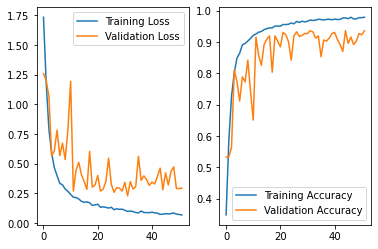

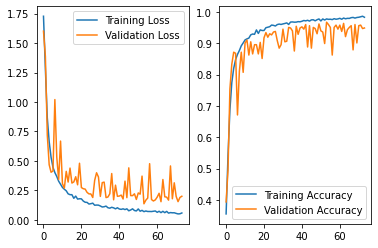

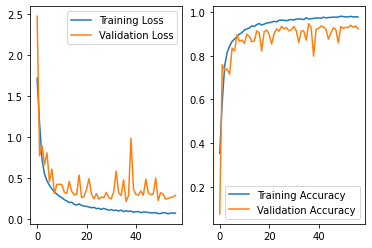

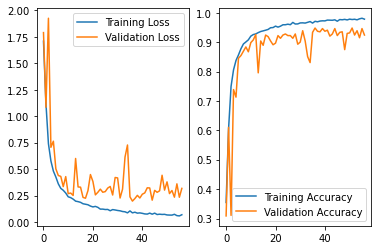

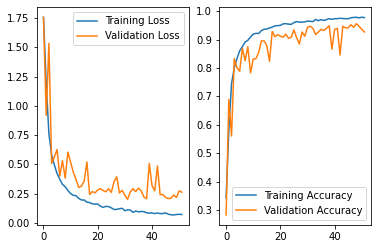

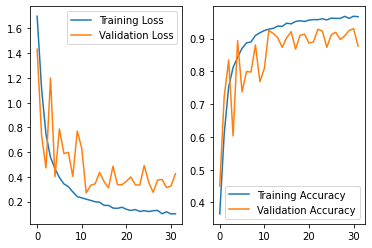

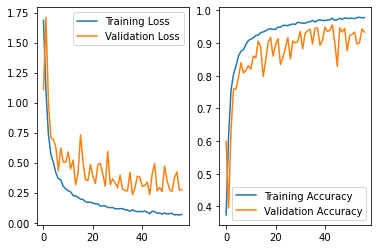

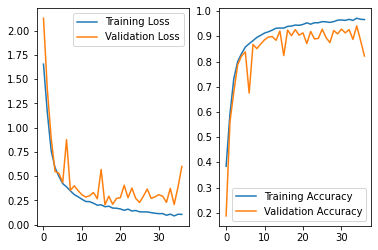

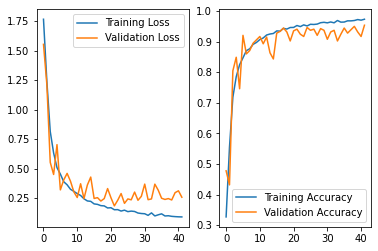

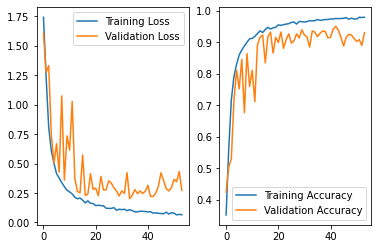

In [54]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [55]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.975      0.89643357 0.81575758 0.90003113 0.97672898 0.93369312
 0.68592298 0.92861775]
precision sdev by class [0.075      0.06678635 0.09275808 0.054449   0.01872413 0.05911353
 0.10838164 0.03800133]
macro precision mean 0.8890231386270884
macro precision sdev 0.02072574693096072
recall mean [0.81666667 0.91987179 0.76818182 0.90275862 0.96275521 0.89586895
 0.82820513 0.9427439 ]
recall sdev [0.28333333 0.07831277 0.08181818 0.04672721 0.01881653 0.04328446
 0.10138748 0.04334886]
macro recall mean 0.8796315111737083
macro recall sdev 0.03395942448236578
f1 mean [0.85238095 0.90452567 0.7857807  0.90012056 0.96944096 0.91322481
 0.7409606  0.93459032]
f1 sdev [0.20337292 0.0478318  0.05475926 0.03802719 0.01054823 0.03961587
 0.06734996 0.02661416]
macro f1 mean 0.8751280703392996
macro f1 sdev 0.028307524940763624
accuracy mean 0.9323986270929133
accuracy sdev 0.009901039271907462


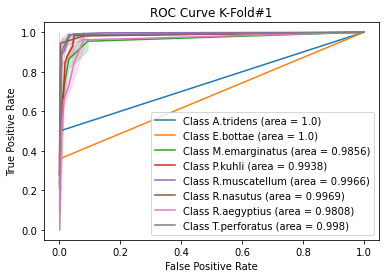

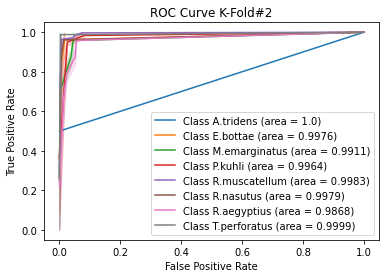

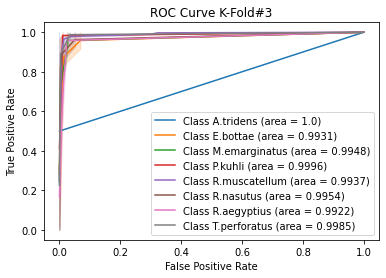

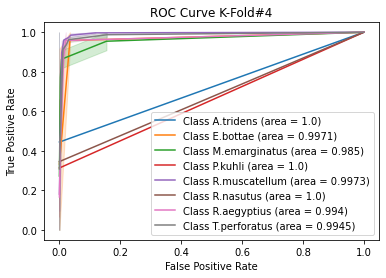

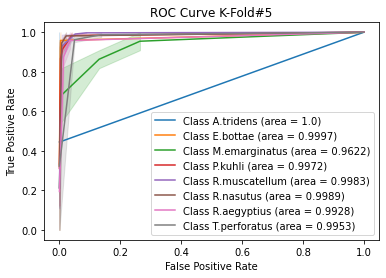

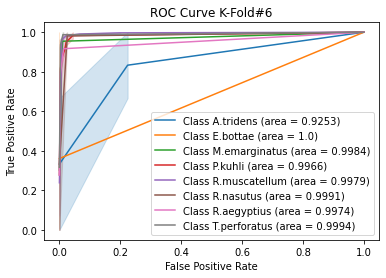

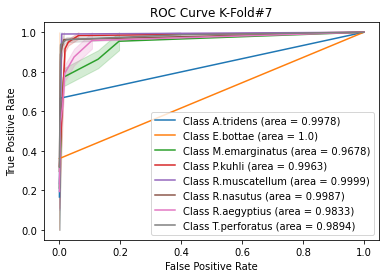

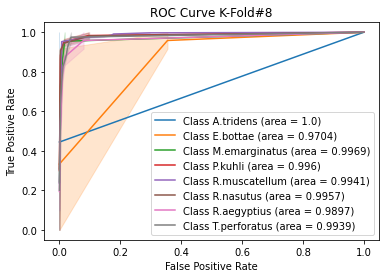

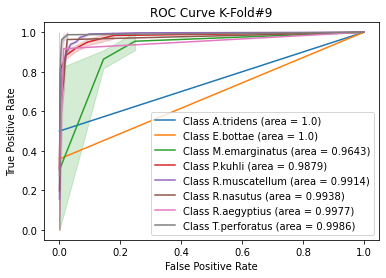

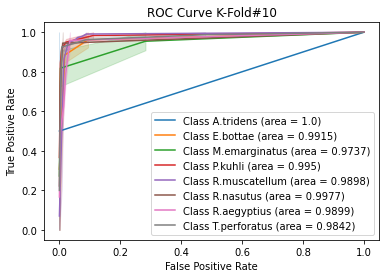

In [56]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [57]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9923076923076923
Std  0.022343595838866123
Sp:  E.bottae
AUC Mean  0.9949402290692113
Std  0.008687366520896725
Sp:  M.emarginatus
AUC Mean  0.9819820584084713
Std  0.013183302840008392
Sp:  P.kuhli
AUC Mean  0.9958821459079779
Std  0.003191067842251516
Sp:  R.muscatellum
AUC Mean  0.9957099671827304
Std  0.0031492404285760425
Sp:  R.nasutus
AUC Mean  0.9974040348557962
Std  0.001841821677138565
Sp:  R.aegyptius
AUC Mean  0.990464359249707
Std  0.005287586592757355
Sp:  T.perforatus
AUC Mean  0.9951726634665661
Std  0.00476662407856424


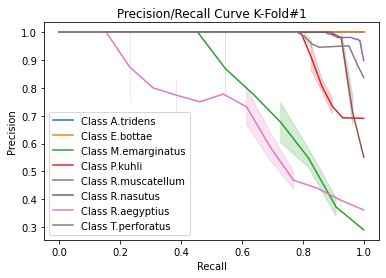

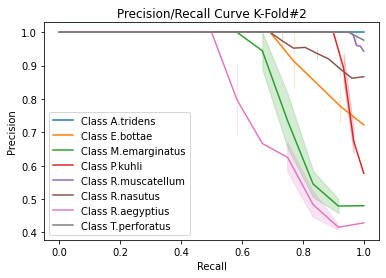

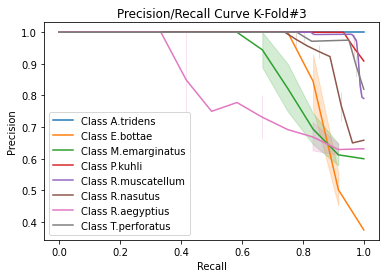

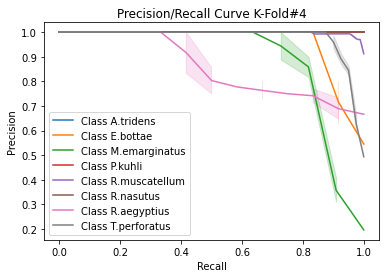

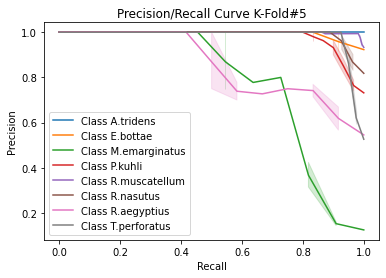

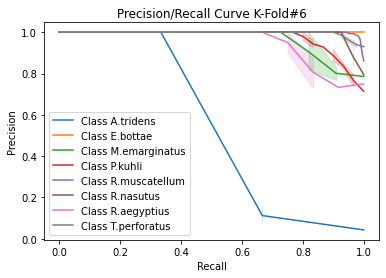

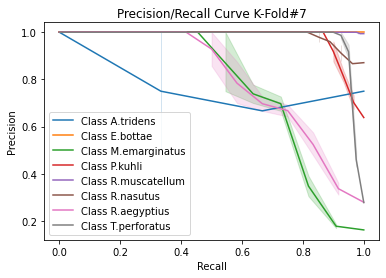

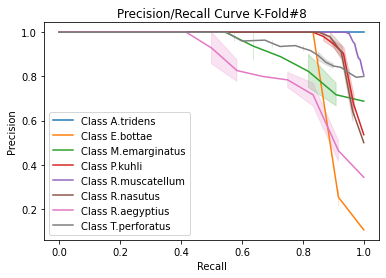

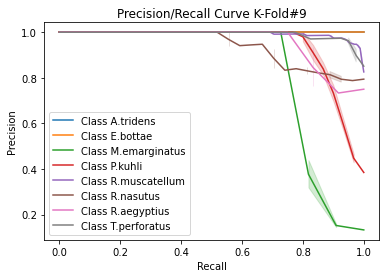

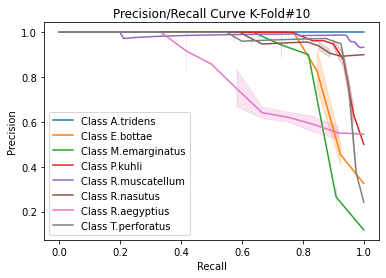

In [58]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  1   0   0   0   0   0   1   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   8   0   0   0   2   1]
 [  0   0   1  24   3   0   1   0]
 [  0   0   0   1 165   0   0   0]
 [  0   0   0   1   1  25   0   0]
 [  0   0   2   0   2   0   8   1]
 [  0   0   0   1   2   0   0  38]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   1   1   1   0]
 [  0   0   9   2   0   0   1   0]
 [  0   0   0  28   0   1   0   1]
 [  0   1   1   2 154   0   5   3]
 [  0   0   0   3   0  23   0   0]
 [  0   0   1   0   0   0  10   1]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   9   0   1   0   2   0]
 [  0   0   0  27   3   0   0   0]
 [  0   0   0   0 163   0   2   1]
 [  0   1   0   0   1  23   2   0]
 [  0   0   1   0   0   0  11   0]
 [  0   0   1   0   0   0   0  40]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

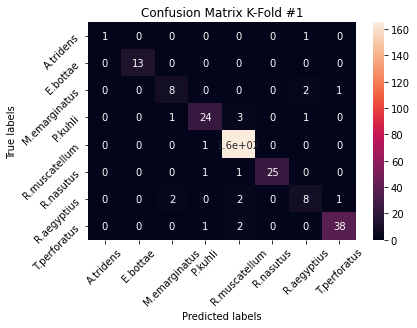

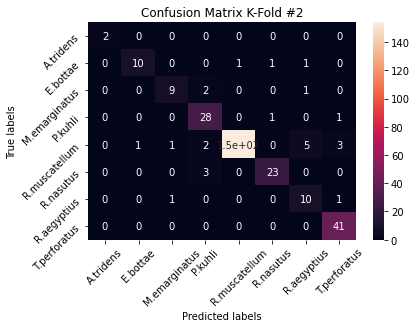

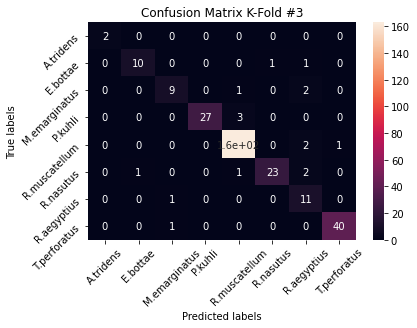

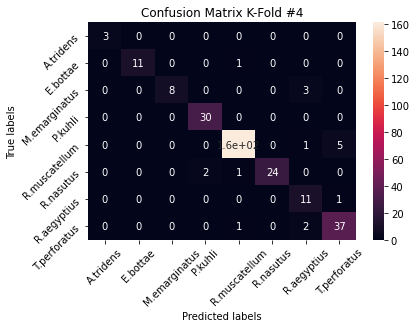

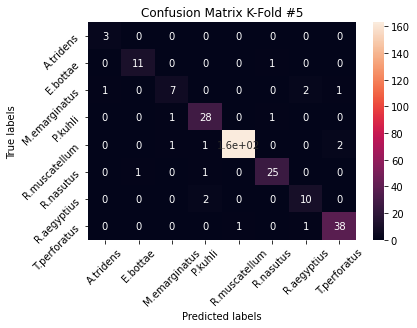

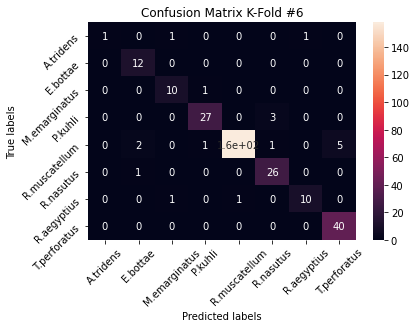

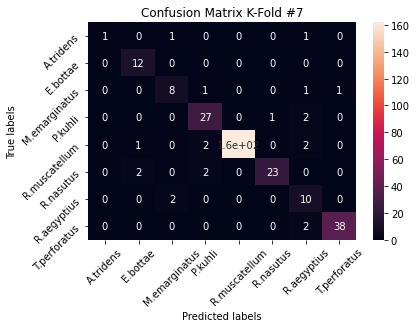

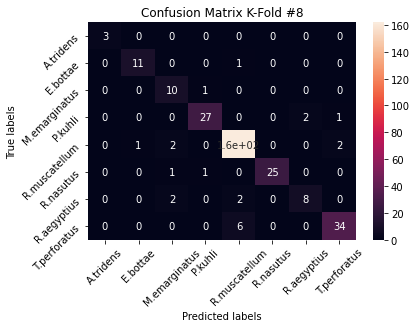

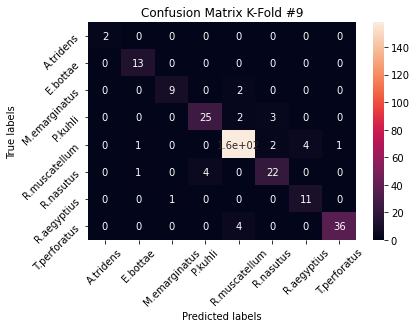

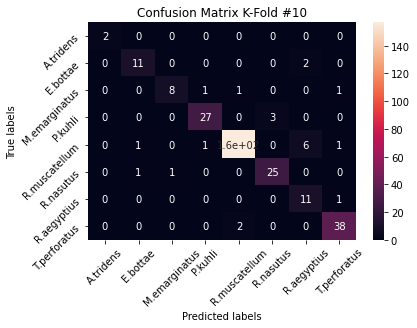

In [59]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  20    0    2    0    0    0    3    0]
 [   0  114    0    0    3    3    4    0]
 [   1    0   86    6    4    0   11    4]
 [   0    0    2  270    8   12    5    2]
 [   0    7    4    8 1603    3   20   20]
 [   0    7    2   14    3  241    2    0]
 [   0    0   10    2    5    0  100    4]
 [   0    0    1    1   16    0    5  380]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   1   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   0 160   0   2   2]
 [  0   0   0   1   0  24   0   0]
 [  0   0   1   0   0   0  10   0]
 [  0   0   0   0   1   0   0  38]]


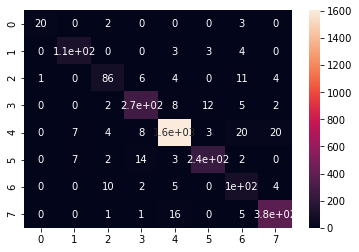

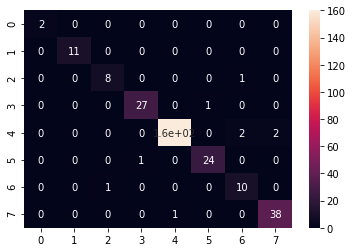

In [60]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.8  0.   0.08 0.   0.   0.   0.12 0.  ]
 [0.   0.92 0.   0.   0.02 0.02 0.03 0.  ]
 [0.01 0.   0.77 0.05 0.04 0.   0.1  0.04]
 [0.   0.   0.01 0.9  0.03 0.04 0.02 0.01]
 [0.   0.   0.   0.   0.96 0.   0.01 0.01]
 [0.   0.03 0.01 0.05 0.01 0.9  0.01 0.  ]
 [0.   0.   0.08 0.02 0.04 0.   0.83 0.03]
 [0.   0.   0.   0.   0.04 0.   0.01 0.94]]


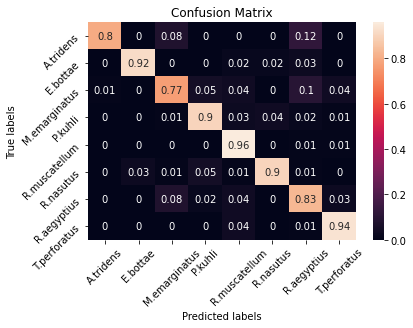

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

# V6 Load Data

In [62]:
folder = "models"
mode_version = "spec_smote_v6"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_smote_v6


In [63]:
X_all = []
Y_all = []

image_folder_path = '../../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((85, 56))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [64]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 56, 85, 3)
(3018,)


In [65]:
def build_current_model():
    inp = Input(shape=(56,85,3))
    lay = Convolution2D(filters=168,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.2)(lay)

    lay = Convolution2D(filters=56,kernel_size=(7,7),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=232,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=104,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.4)(lay)

    lay = Flatten()(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [66]:
model = build_current_model()
model.summary()

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 56, 85, 3)]       0         
_________________________________________________________________
conv2d_136 (Conv2D)          (None, 28, 43, 168)       24864     
_________________________________________________________________
batch_normalization_227 (Bat (None, 28, 43, 168)       672       
_________________________________________________________________
activation_227 (Activation)  (None, 28, 43, 168)       0         
_________________________________________________________________
max_pooling2d_34 (MaxPooling (None, 14, 22, 168)       0         
_________________________________________________________________
dropout_91 (Dropout)         (None, 14, 22, 168)       0         
_________________________________________________________________
conv2d_137 (Conv2D)          (None, 7, 11, 56)         461

In [67]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.4140 - accuracy: 0.4756 - val_loss: 1.6269 - val_accuracy: 0.5772
Epoch 2/100
1199/1199 - 5s - loss: 0.6306 - accuracy: 0.7766 - val_loss: 0.9209 - val_accuracy: 0.6029
Epoch 3/100
1199/1199 - 5s - loss: 0.4177 - accuracy: 0.8508 - val_loss: 0.8308 - val_accuracy: 0.6857
Epoch 4/100
1199/1199 - 5s - loss: 0.3252 - accuracy: 0.8884 - val_loss: 0.7671 - val_accuracy: 0.7316
Epoch 5/100
1199/1199 - 5s - loss: 0.2776 - accuracy: 0.9031 - val_loss: 0.5270 - val_accuracy: 0.8474
E

Epoch 16/100
1199/1199 - 5s - loss: 0.1005 - accuracy: 0.9660 - val_loss: 0.3625 - val_accuracy: 0.8842
Epoch 17/100
1199/1199 - 5s - loss: 0.1086 - accuracy: 0.9616 - val_loss: 0.2390 - val_accuracy: 0.9357
Epoch 18/100
1199/1199 - 5s - loss: 0.1068 - accuracy: 0.9634 - val_loss: 0.7119 - val_accuracy: 0.7794
Epoch 19/100
1199/1199 - 5s - loss: 0.0949 - accuracy: 0.9677 - val_loss: 0.5637 - val_accuracy: 0.8419
Epoch 20/100
1199/1199 - 6s - loss: 0.1000 - accuracy: 0.9657 - val_loss: 0.2815 - val_accuracy: 0.9136
Epoch 21/100
1199/1199 - 5s - loss: 0.0845 - accuracy: 0.9742 - val_loss: 0.2223 - val_accuracy: 0.9393
Epoch 22/100
1199/1199 - 5s - loss: 0.0890 - accuracy: 0.9690 - val_loss: 0.2793 - val_accuracy: 0.9301
Epoch 23/100
1199/1199 - 5s - loss: 0.0855 - accuracy: 0.9715 - val_loss: 0.3277 - val_accuracy: 0.9062
Epoch 24/100
1199/1199 - 5s - loss: 0.0747 - accuracy: 0.9754 - val_loss: 0.2694 - val_accuracy: 0.9320
Epoch 25/100
1199/1199 - 5s - loss: 0.0792 - accuracy: 0.9732 - 

Epoch 22/100
1199/1199 - 5s - loss: 0.0895 - accuracy: 0.9704 - val_loss: 0.2427 - val_accuracy: 0.9210
Epoch 23/100
1199/1199 - 5s - loss: 0.0758 - accuracy: 0.9736 - val_loss: 0.4756 - val_accuracy: 0.8768
Epoch 24/100
1199/1199 - 5s - loss: 0.0816 - accuracy: 0.9724 - val_loss: 0.4324 - val_accuracy: 0.8529
Epoch 25/100
1199/1199 - 5s - loss: 0.0744 - accuracy: 0.9752 - val_loss: 0.2984 - val_accuracy: 0.9136
Epoch 26/100
1199/1199 - 5s - loss: 0.0709 - accuracy: 0.9756 - val_loss: 0.4662 - val_accuracy: 0.8676
Epoch 27/100
1199/1199 - 6s - loss: 0.0694 - accuracy: 0.9784 - val_loss: 0.3503 - val_accuracy: 0.8842
Epoch 28/100
1199/1199 - 5s - loss: 0.0680 - accuracy: 0.9781 - val_loss: 0.2762 - val_accuracy: 0.9210
Epoch 29/100
1199/1199 - 6s - loss: 0.0599 - accuracy: 0.9815 - val_loss: 0.4169 - val_accuracy: 0.8971
Epoch 30/100
1199/1199 - 5s - loss: 0.0621 - accuracy: 0.9790 - val_loss: 0.2596 - val_accuracy: 0.9191
Epoch 31/100
1199/1199 - 5s - loss: 0.0636 - accuracy: 0.9808 - 

Epoch 28/100
1198/1198 - 5s - loss: 0.0596 - accuracy: 0.9813 - val_loss: 0.2796 - val_accuracy: 0.9173
Epoch 29/100
1198/1198 - 5s - loss: 0.0693 - accuracy: 0.9760 - val_loss: 0.4129 - val_accuracy: 0.8934
Epoch 30/100
1198/1198 - 5s - loss: 0.0662 - accuracy: 0.9788 - val_loss: 0.3331 - val_accuracy: 0.8915
Epoch 31/100
1198/1198 - 5s - loss: 0.0629 - accuracy: 0.9812 - val_loss: 0.3396 - val_accuracy: 0.8842
Epoch 32/100
1198/1198 - 5s - loss: 0.0648 - accuracy: 0.9786 - val_loss: 0.2569 - val_accuracy: 0.9191
Epoch 33/100
1198/1198 - 5s - loss: 0.0525 - accuracy: 0.9827 - val_loss: 0.3048 - val_accuracy: 0.9118
Epoch 34/100
1198/1198 - 5s - loss: 0.0638 - accuracy: 0.9794 - val_loss: 0.2628 - val_accuracy: 0.9301
Epoch 35/100
1198/1198 - 5s - loss: 0.0554 - accuracy: 0.9823 - val_loss: 0.3799 - val_accuracy: 0.9044
Epoch 36/100
1198/1198 - 5s - loss: 0.0506 - accuracy: 0.9833 - val_loss: 0.3449 - val_accuracy: 0.9173
Epoch 37/100
1198/1198 - 6s - loss: 0.0554 - accuracy: 0.9813 - 

Epoch 23/100
1198/1198 - 5s - loss: 0.0902 - accuracy: 0.9701 - val_loss: 0.4585 - val_accuracy: 0.8603
Epoch 24/100
1198/1198 - 5s - loss: 0.0693 - accuracy: 0.9766 - val_loss: 0.4386 - val_accuracy: 0.8713
Epoch 25/100
1198/1198 - 6s - loss: 0.0749 - accuracy: 0.9749 - val_loss: 0.5026 - val_accuracy: 0.8511
Epoch 26/100
1198/1198 - 5s - loss: 0.0672 - accuracy: 0.9779 - val_loss: 0.2854 - val_accuracy: 0.9320
Epoch 27/100
1198/1198 - 5s - loss: 0.0695 - accuracy: 0.9773 - val_loss: 0.4145 - val_accuracy: 0.8842
Epoch 28/100
1198/1198 - 6s - loss: 0.0655 - accuracy: 0.9799 - val_loss: 0.3566 - val_accuracy: 0.8695
Epoch 29/100
1198/1198 - 5s - loss: 0.0706 - accuracy: 0.9764 - val_loss: 0.1950 - val_accuracy: 0.9412
Epoch 30/100
1198/1198 - 5s - loss: 0.0640 - accuracy: 0.9787 - val_loss: 0.9539 - val_accuracy: 0.6838
Epoch 31/100
1198/1198 - 5s - loss: 0.0631 - accuracy: 0.9788 - val_loss: 0.2565 - val_accuracy: 0.9430
Epoch 32/100
1198/1198 - 5s - loss: 0.0627 - accuracy: 0.9798 - 

Epoch 47/100
1198/1198 - 5s - loss: 0.0428 - accuracy: 0.9871 - val_loss: 0.5101 - val_accuracy: 0.8438
Epoch 48/100
1198/1198 - 5s - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.2429 - val_accuracy: 0.9357
Epoch 49/100
1198/1198 - 5s - loss: 0.0412 - accuracy: 0.9871 - val_loss: 0.4413 - val_accuracy: 0.9136
Epoch 50/100
1198/1198 - 5s - loss: 0.0420 - accuracy: 0.9852 - val_loss: 0.3490 - val_accuracy: 0.9173
Epoch 51/100
1198/1198 - 6s - loss: 0.0504 - accuracy: 0.9833 - val_loss: 0.3465 - val_accuracy: 0.9283
Epoch 52/100
1198/1198 - 5s - loss: 0.0428 - accuracy: 0.9879 - val_loss: 0.4414 - val_accuracy: 0.8915
Epoch 53/100
1198/1198 - 5s - loss: 0.0411 - accuracy: 0.9884 - val_loss: 0.6670 - val_accuracy: 0.8566
Epoch 54/100
1198/1198 - 5s - loss: 0.0386 - accuracy: 0.9880 - val_loss: 0.3846 - val_accuracy: 0.9099
Epoch 55/100
1198/1198 - 6s - loss: 0.0310 - accuracy: 0.9888 - val_loss: 0.3857 - val_accuracy: 0.9210
Epoch 56/100
1198/1198 - 5s - loss: 0.0390 - accuracy: 0.9876 - 

Epoch 52/100
1198/1198 - 5s - loss: 0.0452 - accuracy: 0.9853 - val_loss: 0.4754 - val_accuracy: 0.8805
Epoch 53/100
1198/1198 - 5s - loss: 0.0399 - accuracy: 0.9882 - val_loss: 0.4622 - val_accuracy: 0.8842
Epoch 54/100
1198/1198 - 6s - loss: 0.0445 - accuracy: 0.9874 - val_loss: 0.2837 - val_accuracy: 0.9320
Epoch 55/100
1198/1198 - 5s - loss: 0.0351 - accuracy: 0.9883 - val_loss: 0.2449 - val_accuracy: 0.9357
Epoch 56/100
1198/1198 - 5s - loss: 0.0456 - accuracy: 0.9863 - val_loss: 0.2621 - val_accuracy: 0.9393
Epoch 57/100
1198/1198 - 5s - loss: 0.0348 - accuracy: 0.9886 - val_loss: 0.3116 - val_accuracy: 0.9338
Epoch 58/100
1198/1198 - 5s - loss: 0.0433 - accuracy: 0.9852 - val_loss: 0.2382 - val_accuracy: 0.9393
Epoch 59/100
1198/1198 - 5s - loss: 0.0356 - accuracy: 0.9898 - val_loss: 0.2981 - val_accuracy: 0.9246
Epoch 60/100
1198/1198 - 6s - loss: 0.0369 - accuracy: 0.9882 - val_loss: 0.3660 - val_accuracy: 0.9136
Epoch 61/100
1198/1198 - 5s - loss: 0.0363 - accuracy: 0.9876 - 

Epoch 5/100
1199/1199 - 5s - loss: 0.2725 - accuracy: 0.9068 - val_loss: 0.5729 - val_accuracy: 0.7831
Epoch 6/100
1199/1199 - 5s - loss: 0.2427 - accuracy: 0.9181 - val_loss: 0.5816 - val_accuracy: 0.7831
Epoch 7/100
1199/1199 - 5s - loss: 0.2061 - accuracy: 0.9306 - val_loss: 0.5095 - val_accuracy: 0.8125
Epoch 8/100
1199/1199 - 5s - loss: 0.1915 - accuracy: 0.9342 - val_loss: 0.6888 - val_accuracy: 0.7629
Epoch 9/100
1199/1199 - 5s - loss: 0.1685 - accuracy: 0.9422 - val_loss: 0.5182 - val_accuracy: 0.8401
Epoch 10/100
1199/1199 - 5s - loss: 0.1591 - accuracy: 0.9454 - val_loss: 0.8723 - val_accuracy: 0.6949
Epoch 11/100
1199/1199 - 5s - loss: 0.1432 - accuracy: 0.9526 - val_loss: 0.5567 - val_accuracy: 0.8107
Epoch 12/100
1199/1199 - 6s - loss: 0.1321 - accuracy: 0.9553 - val_loss: 0.5365 - val_accuracy: 0.8015
Epoch 13/100
1199/1199 - 5s - loss: 0.1300 - accuracy: 0.9558 - val_loss: 0.4493 - val_accuracy: 0.8474
Epoch 14/100
1199/1199 - 5s - loss: 0.1190 - accuracy: 0.9612 - val_l

# LOAD AND EVAL

In [68]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [69]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
        
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

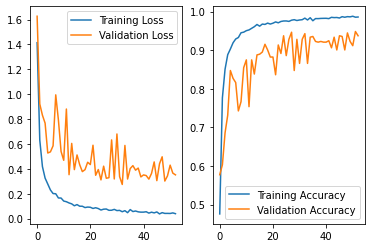

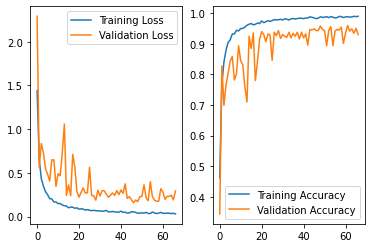

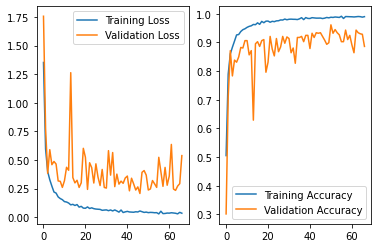

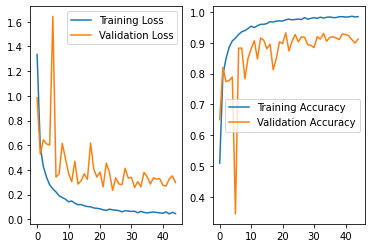

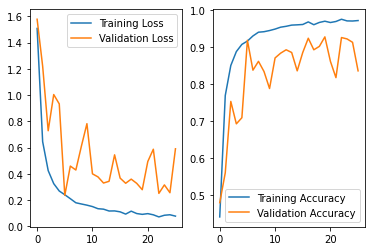

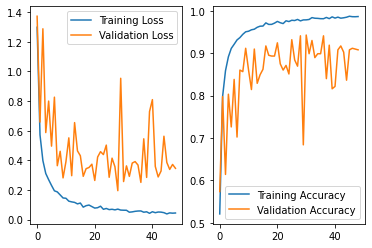

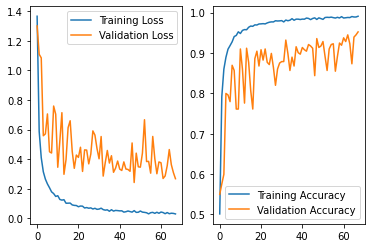

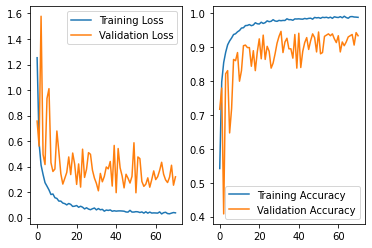

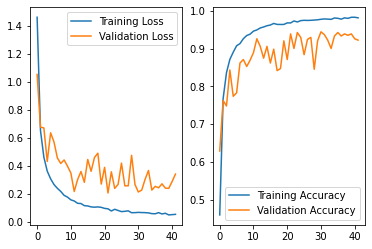

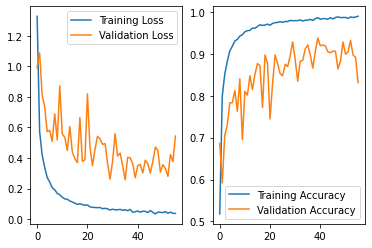

In [70]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [71]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.82666667 0.95730769 0.79050061 0.89896362 0.97147441 0.93613985
 0.67845238 0.94518598]
precision sdev by class [0.21694853 0.08108414 0.18489505 0.04988505 0.01766626 0.0525962
 0.10899354 0.04622856]
macro precision mean 0.8755864007755377
macro precision sdev 0.049635695213904
recall mean [0.88333333 0.87115385 0.69848485 0.90954023 0.96936729 0.92578348
 0.8275641  0.9029878 ]
recall sdev [0.23629078 0.07395169 0.0894966  0.05624919 0.01214503 0.04370434
 0.12308527 0.06762272]
macro recall mean 0.8735268663250079
macro recall sdev 0.03543976545407298
f1 mean [0.82166667 0.9076115  0.72747698 0.90213844 0.97027666 0.92949721
 0.73652958 0.92175087]
f1 sdev [0.19889277 0.0492885  0.10335019 0.03153663 0.00955609 0.03244443
 0.07589173 0.04491369]
macro f1 mean 0.8646184878896277
macro f1 sdev 0.04051148498615804
accuracy mean 0.930085146641438
accuracy sdev 0.019223152717737158


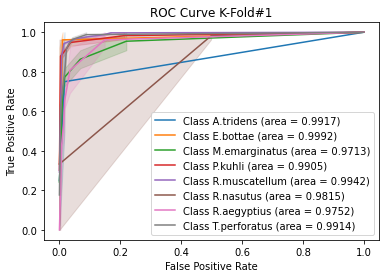

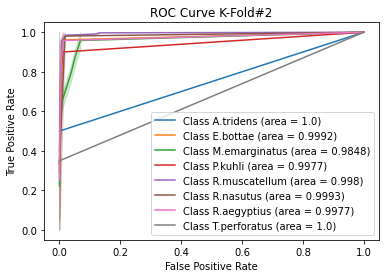

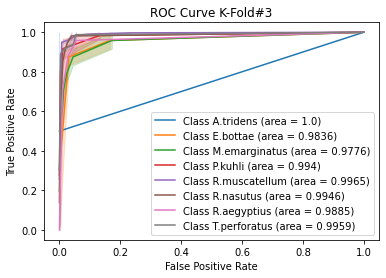

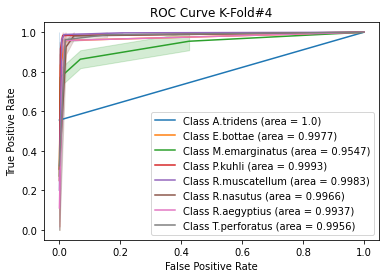

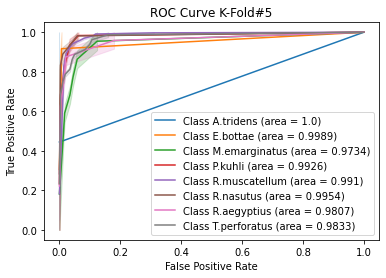

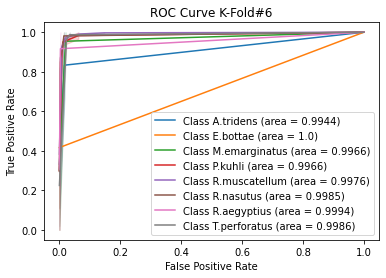

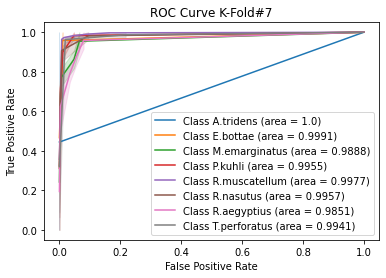

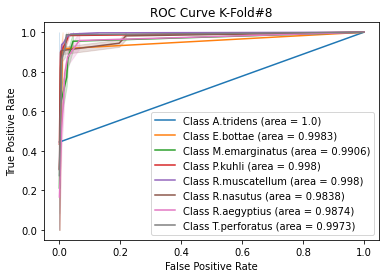

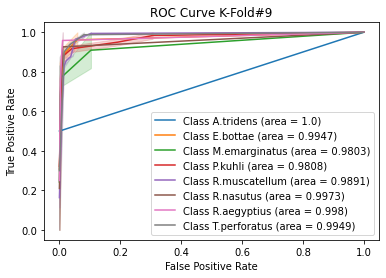

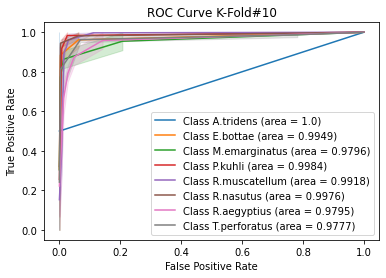

In [72]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [73]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9986092530657749
Std  0.002849099267133408
Sp:  E.bottae
AUC Mean  0.9965572521331827
Std  0.004643735157172763
Sp:  M.emarginatus
AUC Mean  0.9797582382660591
Std  0.011187038752445025
Sp:  P.kuhli
AUC Mean  0.9943391467576882
Std  0.005218236635348182
Sp:  R.muscatellum
AUC Mean  0.9952329717288002
Std  0.0032608260954288433
Sp:  R.nasutus
AUC Mean  0.9940429335876813
Std  0.005853095892716605
Sp:  R.aegyptius
AUC Mean  0.9885226121966963
Std  0.008063330302490778
Sp:  T.perforatus
AUC Mean  0.99287894011475
Std  0.00670732973058057


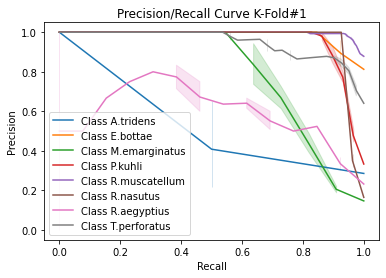

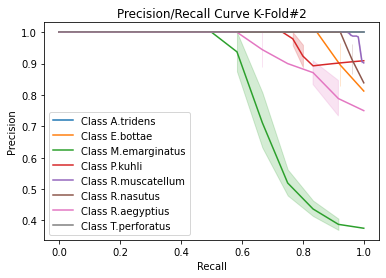

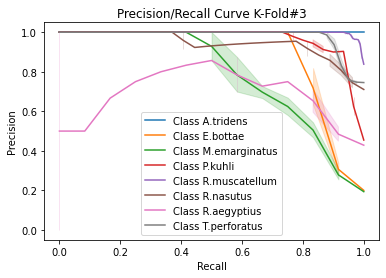

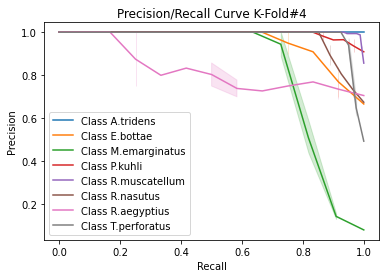

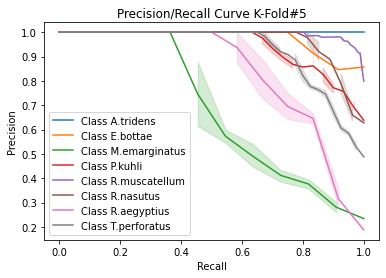

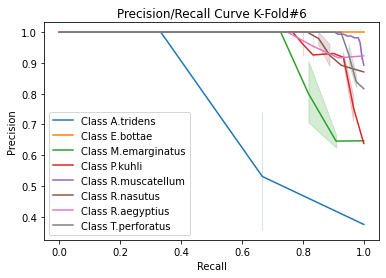

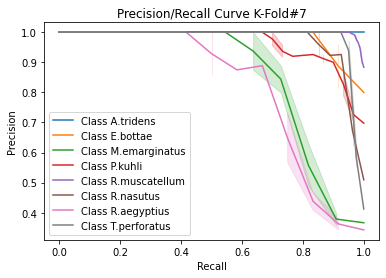

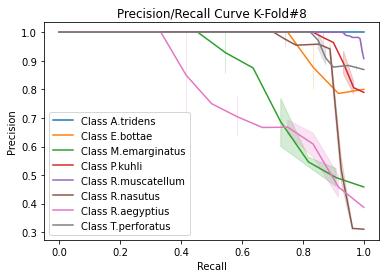

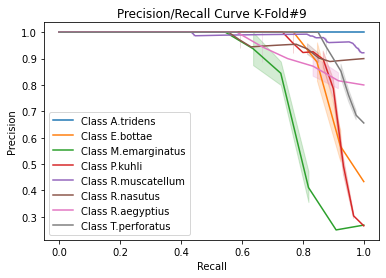

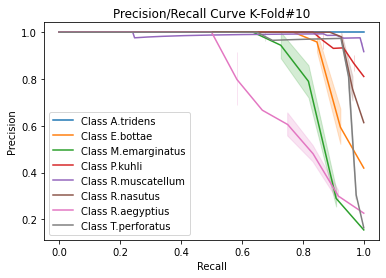

In [74]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  1   0   0   0   0   0   1   0]
 [  0  12   0   0   0   0   1   0]
 [  0   0   8   1   0   0   2   0]
 [  0   0   2  25   2   0   0   0]
 [  0   0   1   0 159   0   1   5]
 [  0   0   0   0   1  26   0   0]
 [  0   0   1   0   2   0   9   1]
 [  1   1   0   0   1   0   0  38]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   8   2   0   0   2   0]
 [  0   0   0  30   0   0   0   0]
 [  0   0   1   1 161   0   3   0]
 [  0   0   0   0   0  25   1   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   6   2   1   0   2   1]
 [  0   0   0  26   2   2   0   0]
 [  0   0   0   1 164   0   1   0]
 [  0   0   1   0   1  24   1   0]
 [  1   0   0   0   1   0  10   0]
 [  0   0   0   0   3   0   1  37]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

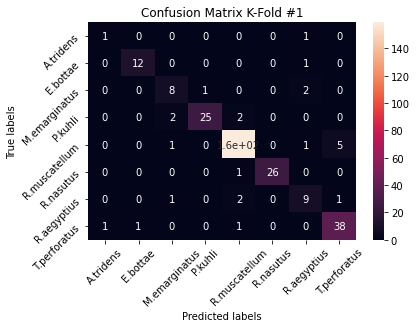

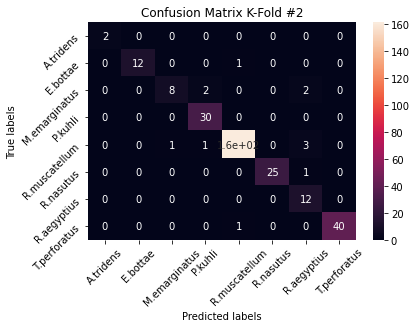

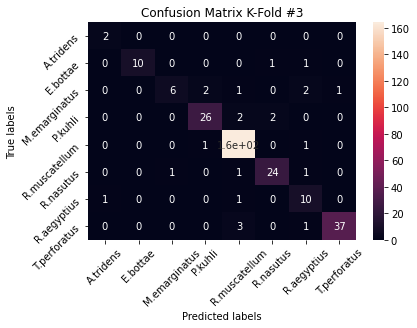

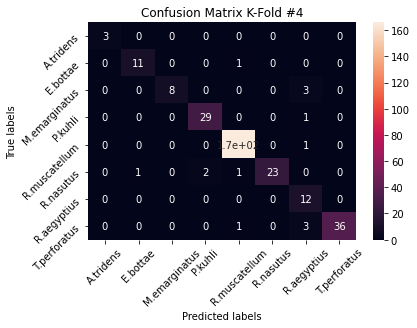

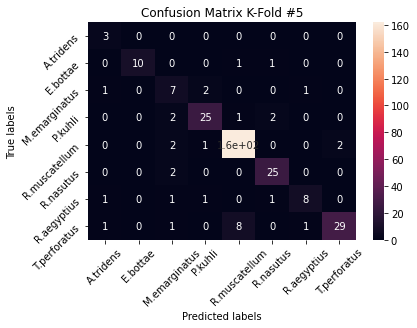

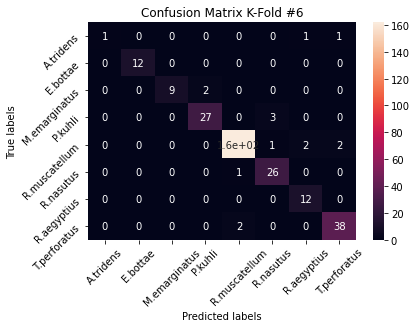

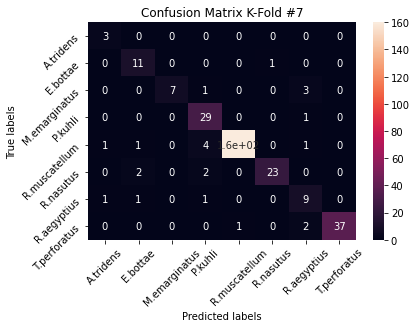

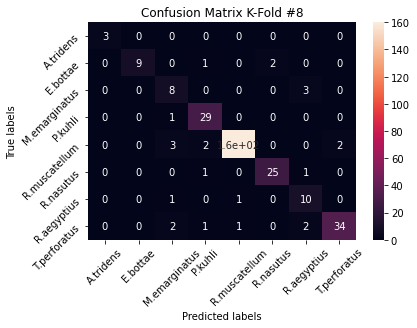

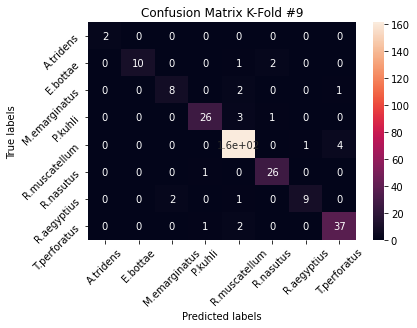

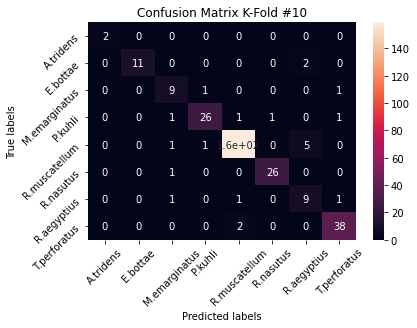

In [75]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  22    0    0    0    0    0    2    1]
 [   0  108    0    1    4    7    4    0]
 [   1    0   78   11    3    0   16    3]
 [   0    0    6  272    9    9    2    1]
 [   1    1    8   10 1614    1   15   15]
 [   0    3    4    6    4  249    3    0]
 [   3    1    6    2    6    1  100    2]
 [   2    1    3    2   22    0    9  364]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   0   0   0]
 [  0   0   7   1   0   0   1   0]
 [  0   0   0  27   0   0   0   0]
 [  0   0   0   1 161   0   1   1]
 [  0   0   0   0   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   2   0   0  36]]


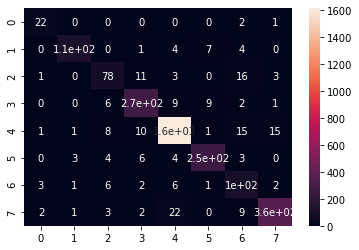

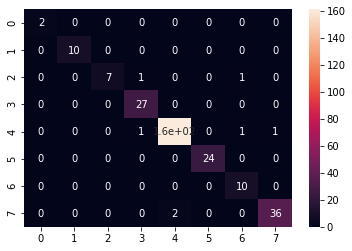

In [76]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.88 0.   0.   0.   0.   0.   0.08 0.04]
 [0.   0.87 0.   0.01 0.03 0.06 0.03 0.  ]
 [0.01 0.   0.7  0.1  0.03 0.   0.14 0.03]
 [0.   0.   0.02 0.91 0.03 0.03 0.01 0.  ]
 [0.   0.   0.   0.01 0.97 0.   0.01 0.01]
 [0.   0.01 0.01 0.02 0.01 0.93 0.01 0.  ]
 [0.02 0.01 0.05 0.02 0.05 0.01 0.83 0.02]
 [0.   0.   0.01 0.   0.05 0.   0.02 0.9 ]]


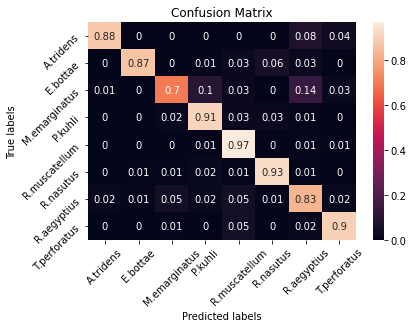

In [77]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);